In [97]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import sklearn.metrics as metrics

#import warnings
#warnings.filterwarnings("ignore")

In [98]:
Company = pd.read_excel('CompData-1.xlsx')

#Glimpse of Data
Company.head()

,Co_Code,Co_Name,_Operating_Expense_Rate,_Research_and_development_expense_rate,_Cash_flow_rate,_Interest_bearing_debt_interest_rate,_Tax_rate_A,_Cash_Flow_Per_Share,_Per_Share_Net_profit_before_tax_Yuan_,_Realized_Sales_Gross_Profit_Growth_Rate,...,_Cash_Flow_to_Equity,_Current_Liability_to_Current_Assets,_Liability_Assets_Flag,_Total_assets_to_GNP_price,_No_credit_Interval,_Degree_of_Financial_Leverage_DFL,_Interest_Coverage_Ratio_Interest_expense_to_EBIT,_Net_Income_Flag,_Equity_to_Liability,Default
0,16974,Hind.Cables,8820000000.00,0.00,0.46,0.00,0.00,0.32,0.19,0.02,...,0.31,0.03,0,0.03,0.62,0.03,0.57,1,0.02,0
1,21214,Tata Tele. Mah.,9380000000.00,4230000000.00,0.46,0.00,0.00,0.32,0.16,0.02,...,0.31,0.04,0,0.01,0.62,0.03,0.56,1,0.03,1
2,14852,ABG Shipyard,3800000000.00,815000000.00,0.45,0.00,0.00,0.30,0.17,0.02,...,0.31,0.03,0,0.00,0.62,0.03,0.57,1,0.04,0
3,2439,GTL,6440000000.00,0.00,0.46,0.00,0.01,0.32,0.17,0.03,...,0.32,0.02,0,0.00,0.62,0.03,0.57,1,0.03,0
4,23505,Bharati Defence,3680000000.00,0.00,0.46,0.00,0.40,0.33,0.18,0.02,...,0.32,0.03,0,0.01,0.62,0.03,0.57,1,0.02,0


In [99]:
Company.shape

(2058, 58)

In [100]:
Company.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2058 entries, 0 to 2057
Data columns (total 58 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   Co_Code                                            2058 non-null   int64  
 1   Co_Name                                            2058 non-null   object 
 2   _Operating_Expense_Rate                            2058 non-null   float64
 3   _Research_and_development_expense_rate             2058 non-null   float64
 4   _Cash_flow_rate                                    2058 non-null   float64
 5   _Interest_bearing_debt_interest_rate               2058 non-null   float64
 6   _Tax_rate_A                                        2058 non-null   float64
 7   _Cash_Flow_Per_Share                               1891 non-null   float64
 8   _Per_Share_Net_profit_before_tax_Yuan_             2058 non-null   float64
 9   _Realize

In [101]:
Company.isnull().sum()

Co_Code                                                0
Co_Name                                                0
_Operating_Expense_Rate                                0
_Research_and_development_expense_rate                 0
_Cash_flow_rate                                        0
_Interest_bearing_debt_interest_rate                   0
_Tax_rate_A                                            0
_Cash_Flow_Per_Share                                 167
_Per_Share_Net_profit_before_tax_Yuan_                 0
_Realized_Sales_Gross_Profit_Growth_Rate               0
_Operating_Profit_Growth_Rate                          0
_Continuous_Net_Profit_Growth_Rate                     0
_Total_Asset_Growth_Rate                               0
_Net_Value_Growth_Rate                                 0
_Total_Asset_Return_Growth_Rate_Ratio                  0
_Cash_Reinvestment_perc                                0
_Current_Ratio                                         0
_Quick_Ratio                   

In [102]:
def fix_name(col_name):
    return Company.rename(columns={col_name:col_name.lstrip("_")},inplace=True)

In [103]:
def remove_space(col_name):
    return Company.rename(columns={col_name:col_name.rstrip(" ")},inplace=True)

In [104]:
features=Company.columns
for f in features:
    if f.startswith("_"):
        f=fix_name(f)
    else:
        f=f

In [105]:
features=Company.columns
for f in features:
    if f.endswith(" "):
        f=remove_space(f)
    else:
        f=f

In [106]:
Company.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2058 entries, 0 to 2057
Data columns (total 58 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Co_Code                                           2058 non-null   int64  
 1   Co_Name                                           2058 non-null   object 
 2   Operating_Expense_Rate                            2058 non-null   float64
 3   Research_and_development_expense_rate             2058 non-null   float64
 4   Cash_flow_rate                                    2058 non-null   float64
 5   Interest_bearing_debt_interest_rate               2058 non-null   float64
 6   Tax_rate_A                                        2058 non-null   float64
 7   Cash_Flow_Per_Share                               1891 non-null   float64
 8   Per_Share_Net_profit_before_tax_Yuan_             2058 non-null   float64
 9   Realized_Sales_Gros

In [107]:
Company.duplicated().sum()

0

In [108]:
Company.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,2058.00,17572.11,21892.89,4.00,3674.00,6240.00,24280.75,72493.00
Operating_Expense_Rate,2058.00,2052388835.76,3252623690.29,0.00,0.00,0.00,4110000000.00,9980000000.00
Research_and_development_expense_rate,2058.00,1208634256.56,2144568158.08,0.00,0.00,0.00,1550000000.00,9980000000.00
Cash_flow_rate,2058.00,0.47,0.02,0.00,0.46,0.46,0.47,1.00
Interest_bearing_debt_interest_rate,2058.00,11130223.52,90425949.04,0.00,0.00,0.00,0.00,990000000.00
Tax_rate_A,2058.00,0.11,0.15,0.00,0.00,0.04,0.22,1.00
Cash_Flow_Per_Share,1891.00,0.32,0.02,0.17,0.31,0.32,0.33,0.46
Per_Share_Net_profit_before_tax_Yuan_,2058.00,0.18,0.03,0.00,0.17,0.18,0.19,0.79
Realized_Sales_Gross_Profit_Growth_Rate,2058.00,0.02,0.02,0.00,0.02,0.02,0.02,1.00
Operating_Profit_Growth_Rate,2058.00,0.85,0.00,0.74,0.85,0.85,0.85,1.00


In [109]:
pd.options.display.float_format = '{:.2f}'.format   

Company.describe()

,Co_Code,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,...,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
count,2058.00,2058.00,2058.00,2058.00,2058.00,2058.00,1891.00,2058.00,2058.00,2058.00,...,2058.00,2044.00,2058.00,2058.00,2058.00,2058.00,2058.00,2058.00,2058.00,2058.00
mean,17572.11,2052388835.76,1208634256.56,0.47,11130223.52,0.11,0.32,0.18,0.02,0.85,...,0.31,0.04,0.00,27793974.74,0.62,0.03,0.57,1.00,0.04,0.11
std,21892.89,3252623690.29,2144568158.08,0.02,90425949.04,0.15,0.02,0.03,0.02,0.00,...,0.01,0.05,0.06,471771444.55,0.01,0.01,0.01,0.00,0.06,0.31
min,4.00,0.00,0.00,0.00,0.00,0.00,0.17,0.00,0.00,0.74,...,0.00,0.00,0.00,0.00,0.41,0.01,0.17,1.00,0.00,0.00
25%,3674.00,0.00,0.00,0.46,0.00,0.00,0.31,0.17,0.02,0.85,...,0.31,0.02,0.00,0.00,0.62,0.03,0.57,1.00,0.02,0.00
50%,6240.00,0.00,0.00,0.46,0.00,0.04,0.32,0.18,0.02,0.85,...,0.31,0.03,0.00,0.00,0.62,0.03,0.57,1.00,0.03,0.00
75%,24280.75,4110000000.00,1550000000.00,0.47,0.00,0.22,0.33,0.19,0.02,0.85,...,0.32,0.04,0.00,0.01,0.62,0.03,0.57,1.00,0.04,0.00
max,72493.00,9980000000.00,9980000000.00,1.00,990000000.00,1.00,0.46,0.79,1.00,1.00,...,0.57,1.00,1.00,9820000000.00,0.96,0.46,0.67,1.00,1.00,1.00


In [110]:
Company.size

119364

In [111]:
Company.isnull().sum().sum()

298

In [112]:
((Company.isnull().sum().sum())/Company.size)  

0.00249656512851446

In [113]:
Company.isna().sum()

Co_Code                                               0
Co_Name                                               0
Operating_Expense_Rate                                0
Research_and_development_expense_rate                 0
Cash_flow_rate                                        0
Interest_bearing_debt_interest_rate                   0
Tax_rate_A                                            0
Cash_Flow_Per_Share                                 167
Per_Share_Net_profit_before_tax_Yuan_                 0
Realized_Sales_Gross_Profit_Growth_Rate               0
Operating_Profit_Growth_Rate                          0
Continuous_Net_Profit_Growth_Rate                     0
Total_Asset_Growth_Rate                               0
Net_Value_Growth_Rate                                 0
Total_Asset_Return_Growth_Rate_Ratio                  0
Cash_Reinvestment_perc                                0
Current_Ratio                                         0
Quick_Ratio                                     

In [114]:
Company[Company.Cash_Flow_Per_Share.isna()] 

,Co_Code,Co_Name,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,...,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
14,2302,Hind.Organ.Chem.,9910000000.00,0.00,0.48,0.00,0.00,NaN,0.16,0.02,...,0.32,0.00,0,0.02,0.62,0.03,0.57,1,0.09,0
31,36781,Healthfore Tech.,0.00,0.00,0.46,0.00,0.00,NaN,0.18,0.02,...,0.31,0.04,0,0.03,0.62,0.03,0.57,1,0.02,0
38,1459,Aluminium Inds.,5390000000.00,3310000000.00,0.47,0.00,0.07,NaN,0.18,0.02,...,0.31,0.01,0,0.01,0.63,0.03,0.57,1,0.14,0
39,2997,Shah Alloys,9860000000.00,645000000.00,0.47,0.00,0.28,NaN,0.17,0.02,...,0.32,0.04,0,0.01,0.62,0.03,0.57,1,0.04,0
42,5155,Paramount Comm.,0.00,2750000000.00,0.46,0.00,0.26,NaN,0.19,0.02,...,0.31,0.03,0,0.00,0.62,0.03,0.57,1,0.02,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2029,13721,GKB Ophthalmics,0.00,0.00,0.48,0.00,0.00,NaN,0.18,0.02,...,0.32,0.01,0,0.00,0.62,0.03,0.57,1,0.09,0
2046,723,Welcast Steels,7490000000.00,0.00,0.46,0.00,0.20,NaN,0.19,0.02,...,0.32,0.02,0,0.00,0.62,0.03,0.57,1,0.03,0
2047,11,Alfred Herbert,8800000000.00,34000000.00,0.47,0.00,0.30,NaN,0.17,0.02,...,0.32,0.05,0,0.04,0.62,0.03,0.57,1,0.02,0
2049,1492,Konark Synth,0.00,560000000.00,0.46,0.00,0.23,NaN,0.17,0.02,...,0.31,0.04,0,0.00,0.62,0.03,0.57,1,0.02,0


In [115]:
Company[Company.Total_debt_to_Total_net_worth.isna()]

,Co_Code,Co_Name,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,...,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
65,27308,Sancia Global,8400000000.00,0.00,0.47,0.00,0.00,0.32,0.17,0.02,...,0.31,0.04,0,0.00,0.62,0.03,0.57,1,0.04,0
322,2435,Rishab Sp. Yarns,0.00,0.00,0.47,0.00,0.00,0.33,0.18,0.02,...,0.31,0.08,0,0.14,0.62,0.03,0.57,1,0.02,0
406,548,Tanfac Inds.,0.00,0.00,0.46,0.00,0.00,0.30,0.19,0.02,...,0.31,0.04,0,0.01,0.62,0.03,0.57,1,0.02,0
577,14853,Kachchh Minerals,0.00,2340000000.00,0.47,0.00,0.15,0.33,0.19,0.02,...,0.32,0.03,0,0.00,0.62,0.03,0.57,1,0.03,0
608,5059,GSL Securities,0.00,0.00,0.45,0.00,0.00,0.31,0.17,0.02,...,0.30,0.01,0,0.00,0.62,0.03,0.57,1,0.07,0
625,27360,Global Vectra,0.00,0.00,0.46,0.00,0.00,0.31,0.15,0.02,...,0.31,0.05,0,0.01,0.62,0.03,0.56,1,0.02,0
776,65456,Spaceage Product,0.00,0.00,0.48,0.00,0.00,0.34,0.20,0.02,...,0.31,0.02,0,0.00,0.62,0.03,0.57,1,0.05,0
1139,68808,Bindal Exports L,6600000000.00,2950000000.00,0.46,0.00,0.00,0.32,0.19,0.02,...,0.32,0.03,0,0.11,0.62,0.03,0.57,1,0.05,0
1158,5009,Himadri credit,7560000000.00,1120000000.00,0.47,0.00,0.15,0.32,0.19,0.02,...,0.32,0.03,0,0.00,0.62,0.03,0.57,1,0.03,0
1166,4047,Parker Agrochem,0.00,0.00,0.46,7000000.00,0.00,0.31,0.17,0.02,...,0.32,0.05,0,0.00,0.62,0.03,0.57,1,0.01,0


In [116]:
Company[Company.Cash_to_Total_Assets.isna()]

,Co_Code,Co_Name,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,...,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
105,697,Priyadarshini,0.00,3020000000.00,0.47,0.00,0.20,0.33,0.18,0.02,...,0.31,0.04,0,0.02,0.62,0.03,0.57,1,0.03,0
106,2696,Bhagheeratha Eng,0.00,0.00,0.46,0.00,0.00,0.32,0.17,0.02,...,0.31,0.03,0,0.00,0.62,0.03,0.56,1,0.04,0
107,761,Stewarts & Lloyd,9980000000.00,4890000000.00,0.46,2000000.00,0.01,0.32,0.24,0.02,...,0.31,0.05,0,0.01,0.62,0.03,0.57,1,0.04,0
116,6298,Sir Shadi Lal,0.00,0.00,0.47,0.00,0.00,0.34,0.17,0.02,...,0.32,0.05,0,0.00,0.62,0.03,0.56,1,0.01,0
122,7341,Zenotech Lab.,9840000000.00,1730000000.00,0.47,0.00,0.19,0.33,0.19,0.02,...,0.31,0.03,0,0.00,0.62,0.03,0.57,1,0.03,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1952,27831,Khoobsurat Ltd,0.00,0.00,0.45,0.00,0.00,0.31,0.13,0.02,...,0.32,0.02,0,0.00,0.62,0.03,0.57,1,0.06,0
1986,6485,NBI Indl. Fin.,8920000000.00,0.00,0.45,0.00,0.00,0.30,0.18,0.02,...,0.31,0.02,0,0.01,0.62,0.03,0.57,1,0.04,0
1987,4896,Titan Securities,0.00,4230000000.00,0.46,0.00,0.01,0.32,0.18,0.02,...,0.32,0.02,0,0.00,0.62,0.03,0.57,1,0.07,0
1990,40291,Max Heights,0.00,6880000000.00,0.46,0.00,0.00,0.33,0.17,0.02,...,0.33,0.04,0,0.00,0.62,0.04,0.57,1,0.02,0


In [117]:
Company[Company.Current_Liability_to_Current_Assets.isna()]

,Co_Code,Co_Name,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,...,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
268,1203,Vegepro Foods,0.00,0.00,0.46,0.00,0.00,0.30,0.19,0.02,...,0.31,NaN,0,0.00,0.62,0.03,0.57,1,0.02,0
437,4561,Olympia Capital,4320000000.00,0.00,0.48,0.00,0.24,0.33,0.19,0.02,...,0.31,NaN,0,0.03,0.62,0.03,0.57,1,0.05,0
669,5080,Prem Somani Fin.,0.00,0.00,0.47,0.00,0.10,0.33,0.19,0.02,...,0.31,NaN,0,0.00,0.62,0.03,0.57,1,0.03,0
721,3439,Gangotri Cement,7570000000.00,0.00,0.47,0.00,0.26,0.42,0.38,0.02,...,0.33,NaN,0,0.00,0.62,0.03,0.57,1,0.02,0
836,13597,Ace Exports,0.00,0.00,0.46,0.00,0.00,0.32,0.17,0.02,...,0.32,NaN,0,0.03,0.62,0.02,0.57,1,0.02,0
1154,7302,Shree Metalloys,9850000000.00,3970000000.00,0.48,0.00,0.00,0.33,0.16,0.02,...,0.32,NaN,0,0.00,0.62,0.03,0.56,1,0.07,0
1188,3432,Prime Inds.,0.00,749000000.00,0.46,0.00,0.30,0.32,0.19,0.02,...,0.32,NaN,0,0.00,0.62,0.03,0.57,1,0.04,0
1252,4742,Parijat Papar,0.00,0.00,0.46,0.11,0.24,0.32,0.23,0.02,...,0.31,NaN,0,0.00,0.62,0.03,0.57,1,0.03,0
1454,5805,Nilachal Refract,0.00,9920000000.00,0.46,0.00,0.00,0.32,0.13,0.02,...,0.32,NaN,0,0.00,0.62,0.03,0.56,1,0.02,1
1577,7645,Indo-City Info.,0.00,1430000000.00,0.46,0.00,0.00,0.31,0.15,0.02,...,0.32,NaN,0,0.01,0.62,0.03,0.56,1,0.02,0


In [118]:
import dtale
dtale.show(Company)

In [119]:
Company.Default.value_counts()

0    1838
1     220
Name: Default, dtype: int64

PART A: Outlier Treatment

In [120]:
Company.Co_Name.value_counts()

Hind.Cables         1
Ritesh Intl.        1
Panther Indl. Pr    1
Manglam India       1
Guj. Investa        1
                   ..
Pulz Electronics    1
Ashiana Agro Ind    1
Rose Merc.          1
Overseas Synth      1
Channel Nine        1
Name: Co_Name, Length: 2058, dtype: int64

In [121]:
Company.Co_Code.value_counts()

16974    1
1691     1
1055     1
24649    1
6440     1
        ..
70460    1
2352     1
6619     1
3447     1
43229    1
Name: Co_Code, Length: 2058, dtype: int64

In [122]:
Company_all=Company.copy()
Company_all.head()

,Co_Code,Co_Name,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,...,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Liability_Assets_Flag,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Net_Income_Flag,Equity_to_Liability,Default
0,16974,Hind.Cables,8820000000.00,0.00,0.46,0.00,0.00,0.32,0.19,0.02,...,0.31,0.03,0,0.03,0.62,0.03,0.57,1,0.02,0
1,21214,Tata Tele. Mah.,9380000000.00,4230000000.00,0.46,0.00,0.00,0.32,0.16,0.02,...,0.31,0.04,0,0.01,0.62,0.03,0.56,1,0.03,1
2,14852,ABG Shipyard,3800000000.00,815000000.00,0.45,0.00,0.00,0.30,0.17,0.02,...,0.31,0.03,0,0.00,0.62,0.03,0.57,1,0.04,0
3,2439,GTL,6440000000.00,0.00,0.46,0.00,0.01,0.32,0.17,0.03,...,0.32,0.02,0,0.00,0.62,0.03,0.57,1,0.03,0
4,23505,Bharati Defence,3680000000.00,0.00,0.46,0.00,0.40,0.33,0.18,0.02,...,0.32,0.03,0,0.01,0.62,0.03,0.57,1,0.02,0


In [123]:
Company_cat=Company[["Co_Code","Co_Name","Default"]]
Company_num=Company.drop(["Co_Code","Co_Name","Default"],axis=1)

In [124]:
Company_num.columns

Index(['Operating_Expense_Rate', 'Research_and_development_expense_rate',
       'Cash_flow_rate', 'Interest_bearing_debt_interest_rate', 'Tax_rate_A',
       'Cash_Flow_Per_Share', 'Per_Share_Net_profit_before_tax_Yuan_',
       'Realized_Sales_Gross_Profit_Growth_Rate',
       'Operating_Profit_Growth_Rate', 'Continuous_Net_Profit_Growth_Rate',
       'Total_Asset_Growth_Rate', 'Net_Value_Growth_Rate',
       'Total_Asset_Return_Growth_Rate_Ratio', 'Cash_Reinvestment_perc',
       'Current_Ratio', 'Quick_Ratio', 'Interest_Expense_Ratio',
       'Total_debt_to_Total_net_worth', 'Long_term_fund_suitability_ratio_A',
       'Net_profit_before_tax_to_Paid_in_capital', 'Total_Asset_Turnover',
       'Accounts_Receivable_Turnover', 'Average_Collection_Days',
       'Inventory_Turnover_Rate_times', 'Fixed_Assets_Turnover_Frequency',
       'Net_Worth_Turnover_Rate_times', 'Operating_profit_per_person',
       'Allocation_rate_per_person', 'Quick_Assets_to_Total_Assets',
       'Cash_to_Tota

In [125]:
features=Company_num.columns

In [126]:
plt.figure(figsize=(40,200))
for f in range(0,len(features)):
    plt.subplot(32,2,f+1)
    sns.boxplot(data=Company_num,x=Company_num.columns[f])
    plt.title(f"Boxplot of {Company_num.columns[f]}",fontsize=30)
    plt.tight_layout();

In [127]:
def remove_outlier(col):
    Q1,Q3=col.quantile([0.25,0.75])
    IQR=Q3-Q1
    upperrange=Q3+(1.5*IQR)
    lowerrange=Q1-(1.5*IQR)
    return upperrange,lowerrange

In [128]:
# Company[Company['Research_and_development_expense_rate']<number_of_outliers(Company['Research_and_development_expense_rate'])[0]].shape[0] #lr

In [129]:
# Company[Company['Research_and_development_expense_rate']>number_of_outliers(Company['Research_and_development_expense_rate'])[1]].shape[0] #ur

In [130]:
### UNIVARIATE ANALYSIS
for f in Company_num.columns:
    iqr_range=remove_outlier(Company_num[f])
    lr=iqr_range[0]
    ur=iqr_range[1]
    print(f"{f} ---> Lower range: {lr}, Upper range: {ur} \n")

Operating_Expense_Rate ---> Lower range: 10274999999.999763, Upper range: -6164999999.999605 

Research_and_development_expense_rate ---> Lower range: 3875000000.0, Upper range: -2325000000.0 

Cash_flow_rate ---> Lower range: 0.48002398824999987, Upper range: 0.4481442342500001 

Interest_bearing_debt_interest_rate ---> Lower range: 0.0012436230000000001, Upper range: -0.000304529 

Tax_rate_A ---> Lower range: 0.5404772743749999, Upper range: -0.324286364625 

Cash_Flow_Per_Share ---> Lower range: 0.34231095599999994, Upper range: 0.29859588400000003 

Per_Share_Net_profit_before_tax_Yuan_ ---> Lower range: 0.2148075635, Upper range: 0.1376817035 

Realized_Sales_Gross_Profit_Growth_Rate ---> Lower range: 0.022292526499999993, Upper range: 0.02191778650000001 

Operating_Profit_Growth_Rate ---> Lower range: 0.848325920375, Upper range: 0.8477627913749999 

Continuous_Net_Profit_Growth_Rate ---> Lower range: 0.217688353875, Upper range: 0.217505598875 

Total_Asset_Growth_Rate ---> Lo

In [131]:
Q1 = Company_num.quantile(0.25)
Q3 = Company_num.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [132]:
### UNIVARIATE
((Company_num > UL) | (Company_num < LL)).sum()

Operating_Expense_Rate                                0
Research_and_development_expense_rate               264
Cash_flow_rate                                      206
Interest_bearing_debt_interest_rate                  94
Tax_rate_A                                           42
Cash_Flow_Per_Share                                 146
Per_Share_Net_profit_before_tax_Yuan_               186
Realized_Sales_Gross_Profit_Growth_Rate             283
Operating_Profit_Growth_Rate                        317
Continuous_Net_Profit_Growth_Rate                   340
Total_Asset_Growth_Rate                               0
Net_Value_Growth_Rate                               304
Total_Asset_Return_Growth_Rate_Ratio                226
Cash_Reinvestment_perc                              220
Current_Ratio                                       193
Quick_Ratio                                         190
Interest_Expense_Ratio                              328
Total_debt_to_Total_net_worth                   

In [133]:
((Company_num > UL) | (Company_num < LL)).sum().sum()

10864

In [134]:
Company_num.size

113190

In [135]:
(10864/113190)*100

9.598021026592455

In [136]:
for f in features:
    ur,lr=remove_outlier(Company_num[f])
    Company_num[f]=np.where(Company_num[f]>ur,ur,Company_num[f])
    Company_num[f]=np.where(Company_num[f]<lr,lr,Company_num[f])

In [137]:
plt.figure(figsize=(40,200))
for f in range(0,len(Company_num.columns)):
    plt.subplot(32,2,f+1)
    sns.boxplot(data=Company_num,x=Company_num.columns[f])
    plt.title(f"Boxplot of {Company_num.columns[f]}",fontsize=30)
    plt.tight_layout();    

PART A: Missing Value Treatment

In [138]:
Company_num.isna().sum().sum()

298

In [139]:
(298/Company.size)*100

0.249656512851446

In [140]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)

In [141]:
Company_num=pd.DataFrame(imputer.fit_transform(Company_num),columns=Company_num.columns)

In [142]:
Company_num.isna().sum()

Operating_Expense_Rate                              0
Research_and_development_expense_rate               0
Cash_flow_rate                                      0
Interest_bearing_debt_interest_rate                 0
Tax_rate_A                                          0
Cash_Flow_Per_Share                                 0
Per_Share_Net_profit_before_tax_Yuan_               0
Realized_Sales_Gross_Profit_Growth_Rate             0
Operating_Profit_Growth_Rate                        0
Continuous_Net_Profit_Growth_Rate                   0
Total_Asset_Growth_Rate                             0
Net_Value_Growth_Rate                               0
Total_Asset_Return_Growth_Rate_Ratio                0
Cash_Reinvestment_perc                              0
Current_Ratio                                       0
Quick_Ratio                                         0
Interest_Expense_Ratio                              0
Total_debt_to_Total_net_worth                       0
Long_term_fund_suitability_r

PART A: Univariate (4 marks) & Bivariate (6 marks) analysis with proper interpretation. (You may choose to include only those variables which were significant in the model building)

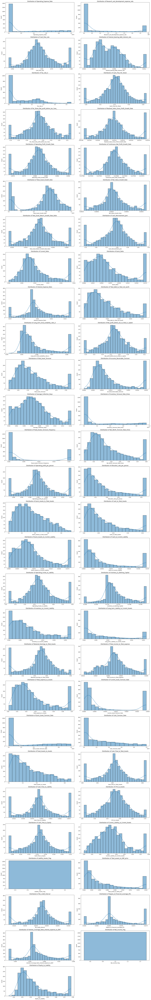

In [143]:
plt.figure(figsize=(20,150))
features=Company_num.columns
for i in range(len(features)):
        plt.subplot(32,2,i+1)
        sns.histplot(data=Company_num,x=Company_num.columns[i],kde=True)
        plt.title(f"Distribution of {Company_num.columns[i]}")
        plt.tight_layout();

In [144]:
Company_num['Default']=Company_cat['Default']

In [145]:
Company_num.Default=Company_num.Default.astype('object')

In [146]:
Company_num.Default.value_counts()

0    1838
1     220
Name: Default, dtype: int64

In [147]:
#sns.pairplot(Company_num,hue='Default',diag_kind='kde');

In [148]:
Company_num.columns

Index(['Operating_Expense_Rate', 'Research_and_development_expense_rate',
       'Cash_flow_rate', 'Interest_bearing_debt_interest_rate', 'Tax_rate_A',
       'Cash_Flow_Per_Share', 'Per_Share_Net_profit_before_tax_Yuan_',
       'Realized_Sales_Gross_Profit_Growth_Rate',
       'Operating_Profit_Growth_Rate', 'Continuous_Net_Profit_Growth_Rate',
       'Total_Asset_Growth_Rate', 'Net_Value_Growth_Rate',
       'Total_Asset_Return_Growth_Rate_Ratio', 'Cash_Reinvestment_perc',
       'Current_Ratio', 'Quick_Ratio', 'Interest_Expense_Ratio',
       'Total_debt_to_Total_net_worth', 'Long_term_fund_suitability_ratio_A',
       'Net_profit_before_tax_to_Paid_in_capital', 'Total_Asset_Turnover',
       'Accounts_Receivable_Turnover', 'Average_Collection_Days',
       'Inventory_Turnover_Rate_times', 'Fixed_Assets_Turnover_Frequency',
       'Net_Worth_Turnover_Rate_times', 'Operating_profit_per_person',
       'Allocation_rate_per_person', 'Quick_Assets_to_Total_Assets',
       'Cash_to_Tota

In [149]:
df_corr=Company_num.drop(['Net_Income_Flag','Liability_Assets_Flag','Default'],axis=1)

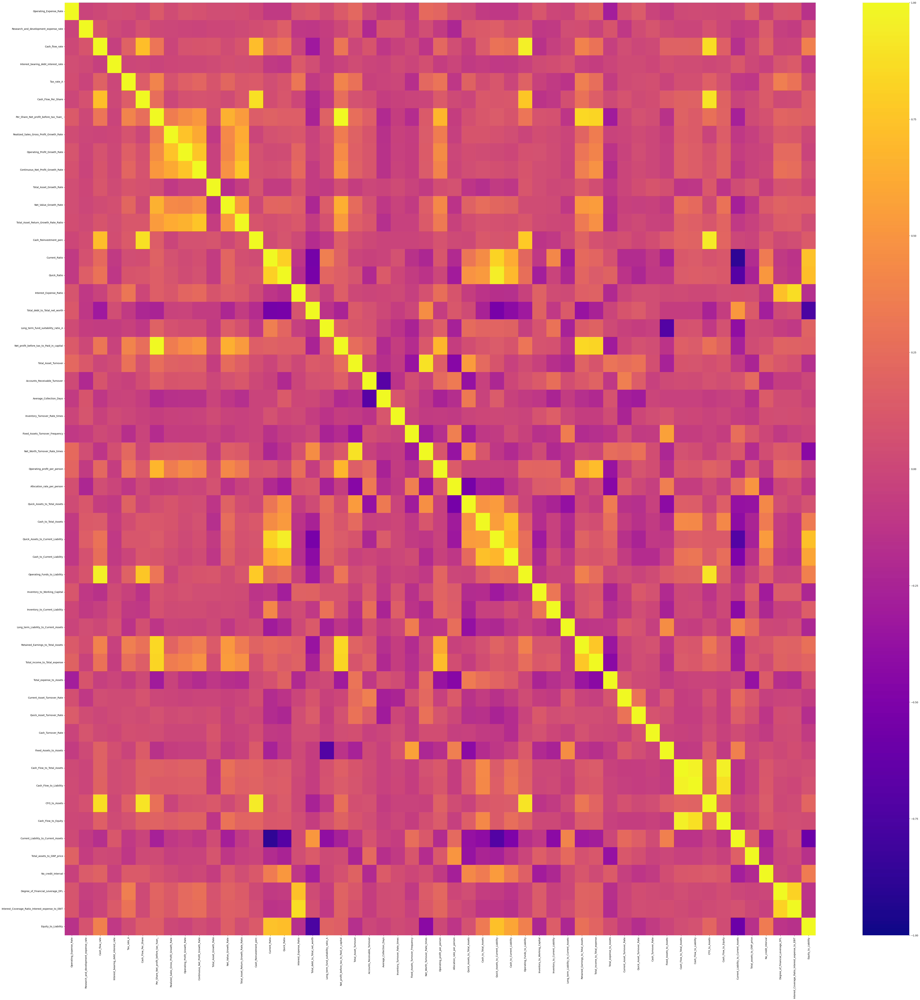

In [150]:
plt.figure(figsize=(70,70))
corr_matrix=df_corr.corr()
sns.heatmap(corr_matrix,cmap='plasma',vmin=-1,vmax=1);

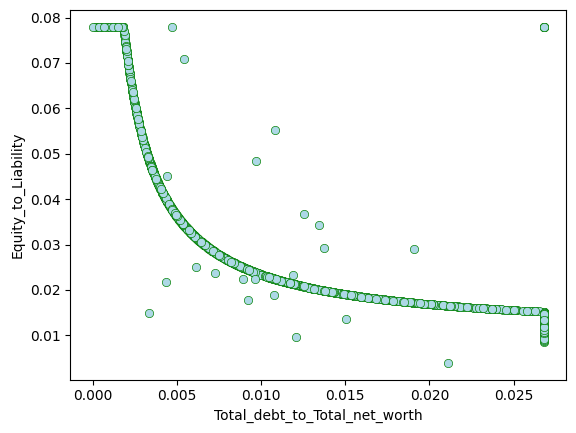

In [151]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Total_debt_to_Total_net_worth,y=Company_num.Equity_to_Liability,
               edgecolor='g',color='lightblue');

In [152]:
Company_num.Equity_to_Liability.corr(Company_num['Total_debt_to_Total_net_worth'])

-0.7504541860667938

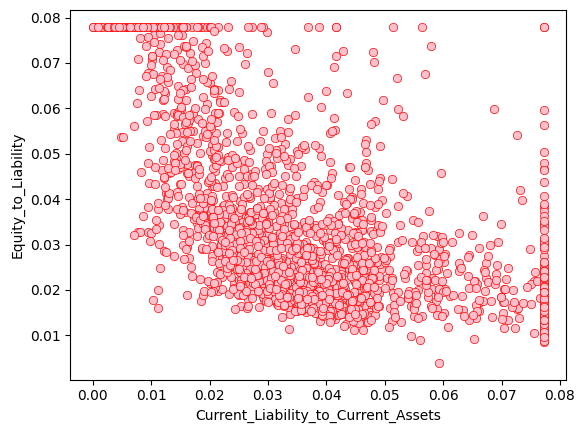

In [153]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Current_Liability_to_Current_Assets,y=Company_num.Equity_to_Liability,
               edgecolor='r',color='pink',);

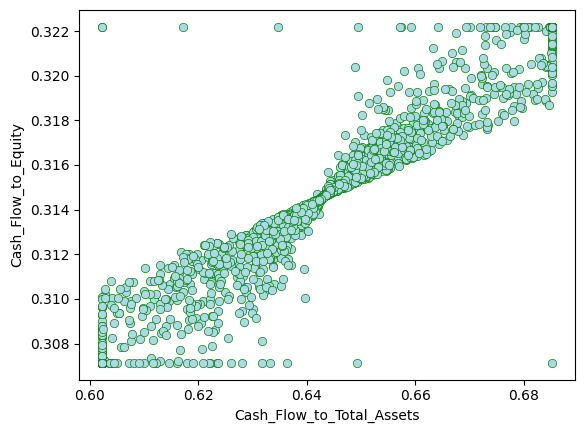

In [154]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Cash_Flow_to_Total_Assets,y=Company_num.Cash_Flow_to_Equity,
               edgecolor='g',color='lightblue');

In [155]:
Company_num.Cash_Flow_to_Equity.corr(Company_num['Cash_Flow_to_Total_Assets'])

0.9549949750589302

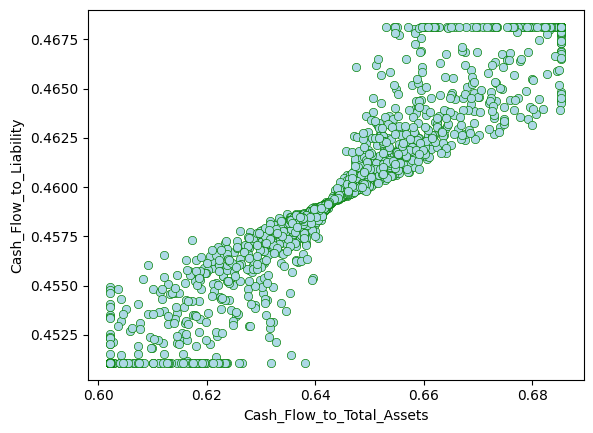

In [156]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Cash_Flow_to_Total_Assets,y=Company_num.Cash_Flow_to_Liability,
               edgecolor='g',color='lightblue');

In [157]:
Company_num.Cash_Flow_to_Liability.corr(Company_num['Cash_Flow_to_Total_Assets'])

0.9625493824189453

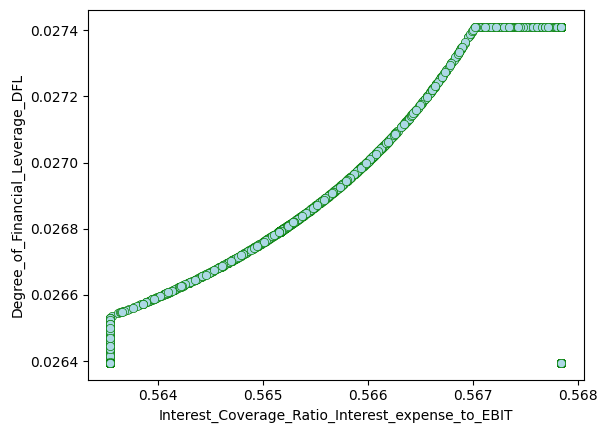

In [158]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Interest_Coverage_Ratio_Interest_expense_to_EBIT,y=Company_num.Degree_of_Financial_Leverage_DFL,
               edgecolor='g',color='lightblue');

In [159]:
Company_num.Degree_of_Financial_Leverage_DFL.corr(Company_num['Interest_Coverage_Ratio_Interest_expense_to_EBIT'])

0.8185759223178531

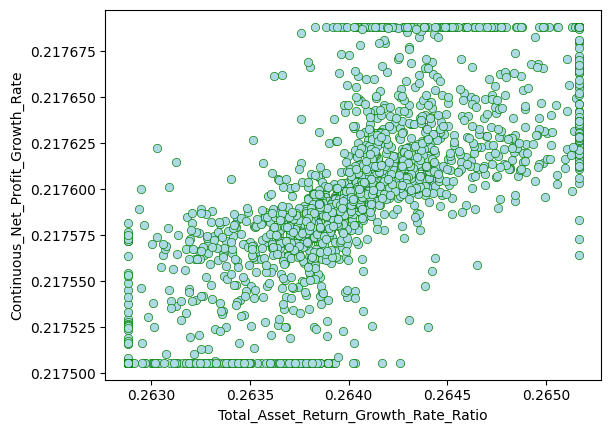

In [160]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Total_Asset_Return_Growth_Rate_Ratio,y=Company_num.Continuous_Net_Profit_Growth_Rate,
               edgecolor='g',color='lightblue');

In [161]:
Company_num.Continuous_Net_Profit_Growth_Rate.corr(Company_num['Total_Asset_Return_Growth_Rate_Ratio'])

0.7539578471525779

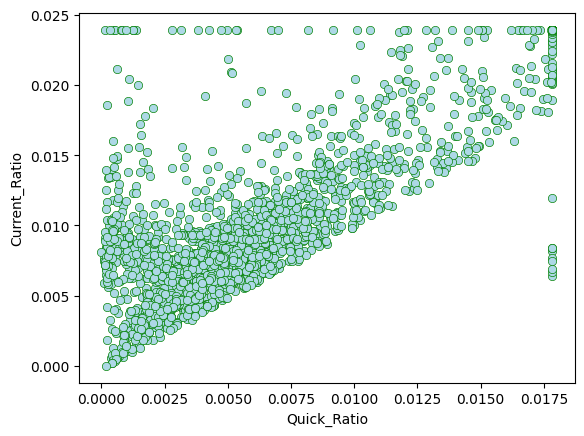

In [162]:
color=sns.color_palette()
sns.scatterplot(data=Company_num,x=Company_num.Quick_Ratio,y=Company_num.Current_Ratio,
               edgecolor='g',color='lightblue');

In [163]:
Company_num.Quick_Ratio.corr(Company_num['Current_Ratio'])

0.8108587499166298

PART A: Train Test Split

In [164]:
Company_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2058 entries, 0 to 2057
Data columns (total 56 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Operating_Expense_Rate                            2058 non-null   float64
 1   Research_and_development_expense_rate             2058 non-null   float64
 2   Cash_flow_rate                                    2058 non-null   float64
 3   Interest_bearing_debt_interest_rate               2058 non-null   float64
 4   Tax_rate_A                                        2058 non-null   float64
 5   Cash_Flow_Per_Share                               2058 non-null   float64
 6   Per_Share_Net_profit_before_tax_Yuan_             2058 non-null   float64
 7   Realized_Sales_Gross_Profit_Growth_Rate           2058 non-null   float64
 8   Operating_Profit_Growth_Rate                      2058 non-null   float64
 9   Continuous_Net_Prof

In [165]:
from sklearn.model_selection import train_test_split
X=Company_num.drop(["Default","Net_Income_Flag","Liability_Assets_Flag"], axis=1)
# dependent variable
y=Company_num["Default"]

In [166]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33,random_state=42)

In [167]:
X_train.head()

,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,...,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Equity_to_Liability
631,0.00,3875000000.00,0.46,0.00,0.00,0.32,0.18,0.02,0.85,0.22,...,0.64,0.46,0.58,0.31,0.03,0.01,0.62,0.03,0.57,0.02
1799,0.00,0.00,0.48,0.00,0.00,0.32,0.17,0.02,0.85,0.22,...,0.69,0.47,0.68,0.32,0.01,0.00,0.63,0.03,0.57,0.08
1924,0.00,0.00,0.48,0.00,0.24,0.33,0.18,0.02,0.85,0.22,...,0.61,0.45,0.65,0.31,0.04,0.00,0.62,0.03,0.57,0.06
1629,852000000.00,3460000000.00,0.46,0.00,0.12,0.32,0.20,0.02,0.85,0.22,...,0.69,0.47,0.59,0.32,0.03,0.02,0.62,0.03,0.57,0.02
363,7870000000.00,0.00,0.48,0.00,0.08,0.32,0.17,0.02,0.85,0.22,...,0.62,0.45,0.62,0.31,0.01,0.00,0.62,0.03,0.57,0.08


In [168]:
y_train.head()

631     0
1799    0
1924    0
1629    0
363     0
Name: Default, dtype: object

In [169]:
X_test.head()

,Operating_Expense_Rate,Research_and_development_expense_rate,Cash_flow_rate,Interest_bearing_debt_interest_rate,Tax_rate_A,Cash_Flow_Per_Share,Per_Share_Net_profit_before_tax_Yuan_,Realized_Sales_Gross_Profit_Growth_Rate,Operating_Profit_Growth_Rate,Continuous_Net_Profit_Growth_Rate,...,Cash_Flow_to_Total_Assets,Cash_Flow_to_Liability,CFO_to_Assets,Cash_Flow_to_Equity,Current_Liability_to_Current_Assets,Total_assets_to_GNP_price,No_credit_Interval,Degree_of_Financial_Leverage_DFL,Interest_Coverage_Ratio_Interest_expense_to_EBIT,Equity_to_Liability
1298,0.00,0.00,0.46,0.00,0.26,0.32,0.20,0.02,0.85,0.22,...,0.69,0.47,0.49,0.32,0.03,0.00,0.62,0.03,0.57,0.02
591,6310000000.00,1140000000.00,0.48,0.00,0.03,0.33,0.19,0.02,0.85,0.22,...,0.69,0.47,0.66,0.32,0.02,0.00,0.62,0.03,0.57,0.04
1318,0.00,0.00,0.46,0.00,0.00,0.32,0.16,0.02,0.85,0.22,...,0.66,0.47,0.56,0.32,0.02,0.00,0.62,0.03,0.56,0.05
1067,0.00,0.00,0.47,0.00,0.21,0.33,0.18,0.02,0.85,0.22,...,0.64,0.46,0.62,0.31,0.04,0.00,0.62,0.03,0.57,0.04
29,0.00,951000000.00,0.46,0.00,0.00,0.32,0.17,0.02,0.85,0.22,...,0.64,0.46,0.59,0.31,0.05,0.00,0.62,0.03,0.56,0.04


In [170]:
y_test.head()

1298    0
591     0
1318    0
1067    0
29      0
Name: Default, dtype: object

PART A: Build Logistic Regression Model (using statsmodels library) on most important variables on train dataset and choose the optimum cut-off. Also showcase your model building approach

In [171]:
import statsmodels.formula.api as SM
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [172]:
def calc_vif(X):
    # Calculating VIF
    vif=pd.DataFrame()
    vif["variables"]=X.columns
    vif["VIF"] = [variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    return(vif)

In [173]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,6,Per_Share_Net_profit_before_tax_Yuan_,99.71
1,19,Net_profit_before_tax_to_Paid_in_capital,99.25
2,43,Cash_Flow_to_Total_Assets,44.44
3,45,CFO_to_Assets,29.44
4,32,Operating_Funds_to_Liability,21.63
5,30,Quick_Assets_to_Current_Liability,19.82
6,44,Cash_Flow_to_Liability,17.83
7,2,Cash_flow_rate,16.47
8,46,Cash_Flow_to_Equity,15.13
9,25,Net_Worth_Turnover_Rate_times,15.05


In [174]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,42,Cash_Flow_to_Total_Assets,44.41
1,44,CFO_to_Assets,29.21
2,31,Operating_Funds_to_Liability,21.60
3,29,Quick_Assets_to_Current_Liability,19.82
4,43,Cash_Flow_to_Liability,17.83
5,2,Cash_flow_rate,16.47
6,45,Cash_Flow_to_Equity,15.11
7,24,Net_Worth_Turnover_Rate_times,15.05
8,13,Current_Ratio,14.68
9,19,Total_Asset_Turnover,14.16


In [175]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,43,CFO_to_Assets,29.00
1,31,Operating_Funds_to_Liability,21.57
2,29,Quick_Assets_to_Current_Liability,19.79
3,2,Cash_flow_rate,16.44
4,24,Net_Worth_Turnover_Rate_times,15.05
5,13,Current_Ratio,14.67
6,19,Total_Asset_Turnover,14.16
7,12,Cash_Reinvestment_perc,12.89
8,14,Quick_Ratio,12.55
9,18,Net_profit_before_tax_to_Paid_in_capital,8.33


In [176]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,29,Quick_Assets_to_Current_Liability,19.79
1,31,Operating_Funds_to_Liability,18.81
2,2,Cash_flow_rate,16.02
3,24,Net_Worth_Turnover_Rate_times,15.05
4,13,Current_Ratio,14.65
5,19,Total_Asset_Turnover,14.15
6,14,Quick_Ratio,12.55
7,18,Net_profit_before_tax_to_Paid_in_capital,8.13
8,44,Current_Liability_to_Current_Assets,8.07
9,37,Total_expense_to_Assets,6.85


In [177]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,30,Operating_Funds_to_Liability,18.65
1,2,Cash_flow_rate,15.80
2,24,Net_Worth_Turnover_Rate_times,15.02
3,19,Total_Asset_Turnover,14.07
4,13,Current_Ratio,12.93
5,18,Net_profit_before_tax_to_Paid_in_capital,8.11
6,43,Current_Liability_to_Current_Assets,7.99
7,14,Quick_Ratio,7.95
8,12,Cash_Reinvestment_perc,6.72
9,47,Interest_Coverage_Ratio_Interest_expense_to_EBIT,6.09


In [178]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,24,Net_Worth_Turnover_Rate_times,14.89
1,19,Total_Asset_Turnover,13.94
2,13,Current_Ratio,12.77
3,18,Net_profit_before_tax_to_Paid_in_capital,8.07
4,42,Current_Liability_to_Current_Assets,7.98
5,14,Quick_Ratio,7.84
6,46,Interest_Coverage_Ratio_Interest_expense_to_EBIT,6.08
7,12,Cash_Reinvestment_perc,6.03
8,5,Cash_Flow_Per_Share,5.82
9,27,Quick_Assets_to_Total_Assets,5.45


In [179]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,13,Current_Ratio,12.72
1,18,Net_profit_before_tax_to_Paid_in_capital,8.03
2,41,Current_Liability_to_Current_Assets,7.97
3,14,Quick_Ratio,7.78
4,45,Interest_Coverage_Ratio_Interest_expense_to_EBIT,6.08
5,12,Cash_Reinvestment_perc,6.03
6,5,Cash_Flow_Per_Share,5.82
7,26,Quick_Assets_to_Total_Assets,5.45
8,46,Equity_to_Liability,5.32
9,33,Total_income_to_Total_expense,5.14


In [180]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,17,Net_profit_before_tax_to_Paid_in_capital,8.02
1,13,Quick_Ratio,6.26
2,44,Interest_Coverage_Ratio_Interest_expense_to_EBIT,6.08
3,12,Cash_Reinvestment_perc,6.02
4,5,Cash_Flow_Per_Share,5.81
5,25,Quick_Assets_to_Total_Assets,5.45
6,32,Total_income_to_Total_expense,5.14
7,31,Retained_Earnings_to_Total_Assets,5.13
8,39,Cash_Flow_to_Equity,5.13
9,40,Current_Liability_to_Current_Assets,5.06


In [181]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,13,Quick_Ratio,6.24
1,43,Interest_Coverage_Ratio_Interest_expense_to_EBIT,6.04
2,12,Cash_Reinvestment_perc,5.98
3,5,Cash_Flow_Per_Share,5.70
4,24,Quick_Assets_to_Total_Assets,5.45
5,38,Cash_Flow_to_Equity,5.10
6,39,Current_Liability_to_Current_Assets,5.06
7,37,Cash_Flow_to_Liability,4.93
8,44,Equity_to_Liability,4.83
9,36,Fixed_Assets_to_Assets,4.69


In [182]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,42,Interest_Coverage_Ratio_Interest_expense_to_EBIT,6.04
1,12,Cash_Reinvestment_perc,5.98
2,5,Cash_Flow_Per_Share,5.67
3,37,Cash_Flow_to_Equity,5.10
4,36,Cash_Flow_to_Liability,4.93
5,23,Quick_Assets_to_Total_Assets,4.88
6,35,Fixed_Assets_to_Assets,4.62
7,13,Interest_Expense_Ratio,4.48
8,30,Total_income_to_Total_expense,4.35
9,38,Current_Liability_to_Current_Assets,4.12


In [183]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,12,Cash_Reinvestment_perc,5.98
1,5,Cash_Flow_Per_Share,5.67
2,37,Cash_Flow_to_Equity,5.10
3,36,Cash_Flow_to_Liability,4.93
4,23,Quick_Assets_to_Total_Assets,4.87
5,35,Fixed_Assets_to_Assets,4.62
6,30,Total_income_to_Total_expense,4.34
7,42,Equity_to_Liability,4.11
8,38,Current_Liability_to_Current_Assets,4.09
9,29,Retained_Earnings_to_Total_Assets,3.75


In [184]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,36,Cash_Flow_to_Equity,5.05
1,35,Cash_Flow_to_Liability,4.89
2,22,Quick_Assets_to_Total_Assets,4.87
3,34,Fixed_Assets_to_Assets,4.59
4,29,Total_income_to_Total_expense,4.25
5,41,Equity_to_Liability,4.10
6,37,Current_Liability_to_Current_Assets,4.07
7,24,Cash_to_Current_Liability,3.73
8,28,Retained_Earnings_to_Total_Assets,3.69
9,23,Cash_to_Total_Assets,3.61


In [185]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,22,Quick_Assets_to_Total_Assets,4.87
1,34,Fixed_Assets_to_Assets,4.59
2,29,Total_income_to_Total_expense,4.25
3,40,Equity_to_Liability,4.09
4,36,Current_Liability_to_Current_Assets,4.06
5,28,Retained_Earnings_to_Total_Assets,3.69
6,24,Cash_to_Current_Liability,3.67
7,23,Cash_to_Total_Assets,3.52
8,15,Total_Asset_Turnover,3.47
9,13,Total_debt_to_Total_net_worth,3.13


In [186]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,7,Operating_Profit_Growth_Rate,63829040.14
1,33,Fixed_Assets_to_Assets,4.43
2,28,Total_income_to_Total_expense,4.20
3,39,Equity_to_Liability,4.09
4,27,Retained_Earnings_to_Total_Assets,3.68
5,23,Cash_to_Current_Liability,3.64
6,35,Current_Liability_to_Current_Assets,3.53
7,22,Cash_to_Total_Assets,3.28
8,2,Cash_flow_rate,3.10
9,8,Continuous_Net_Profit_Growth_Rate,3.03


In [187]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,7,Continuous_Net_Profit_Growth_Rate,2583679.92
1,36,No_credit_Interval,988745.85
2,11,Interest_Expense_Ratio,656992.23
3,10,Total_Asset_Return_Growth_Rate_Ratio,539011.62
4,23,Inventory_to_Working_Capital,256773.76
5,6,Realized_Sales_Gross_Profit_Growth_Rate,105062.79
6,37,Degree_of_Financial_Leverage_DFL,20583.92
7,19,Operating_profit_per_person,4446.10
8,27,Total_income_to_Total_expense,446.15
9,9,Net_Value_Growth_Rate,179.25


In [188]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,10,Interest_Expense_Ratio,509520.59
1,35,No_credit_Interval,480854.30
2,9,Total_Asset_Return_Growth_Rate_Ratio,425988.16
3,22,Inventory_to_Working_Capital,220032.46
4,6,Realized_Sales_Gross_Profit_Growth_Rate,104964.37
5,36,Degree_of_Financial_Leverage_DFL,19028.38
6,18,Operating_profit_per_person,4446.02
7,26,Total_income_to_Total_expense,441.96
8,8,Net_Value_Growth_Rate,176.02
9,12,Long_term_fund_suitability_ratio_A,87.15


In [189]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,9,Total_Asset_Return_Growth_Rate_Ratio,404872.77
1,34,No_credit_Interval,362891.42
2,21,Inventory_to_Working_Capital,203484.81
3,6,Realized_Sales_Gross_Profit_Growth_Rate,104929.91
4,24,Retained_Earnings_to_Total_Assets,20493.08
5,2,Cash_flow_rate,11965.84
6,35,Degree_of_Financial_Leverage_DFL,11509.88
7,17,Operating_profit_per_person,4372.11
8,5,Cash_Flow_Per_Share,2707.57
9,25,Total_income_to_Total_expense,437.43


In [190]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,33,No_credit_Interval,235913.77
1,20,Inventory_to_Working_Capital,194134.50
2,6,Realized_Sales_Gross_Profit_Growth_Rate,76459.44
3,23,Retained_Earnings_to_Total_Assets,20493.01
4,2,Cash_flow_rate,11943.29
5,34,Degree_of_Financial_Leverage_DFL,11495.11
6,16,Operating_profit_per_person,4319.59
7,5,Cash_Flow_Per_Share,2697.58
8,24,Total_income_to_Total_expense,430.11
9,8,Net_Value_Growth_Rate,168.05


In [191]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,20,Inventory_to_Working_Capital,89189.88
1,6,Realized_Sales_Gross_Profit_Growth_Rate,62942.44
2,23,Retained_Earnings_to_Total_Assets,19848.72
3,30,Cash_Flow_to_Liability,13308.65
4,2,Cash_flow_rate,11862.89
5,33,Degree_of_Financial_Leverage_DFL,11427.74
6,16,Operating_profit_per_person,4293.01
7,5,Cash_Flow_Per_Share,2696.80
8,24,Total_income_to_Total_expense,422.05
9,8,Net_Value_Growth_Rate,163.20


In [192]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,6,Realized_Sales_Gross_Profit_Growth_Rate,27097.62
1,22,Retained_Earnings_to_Total_Assets,16185.90
2,29,Cash_Flow_to_Liability,12655.91
3,2,Cash_flow_rate,11647.01
4,32,Degree_of_Financial_Leverage_DFL,10595.47
5,16,Operating_profit_per_person,4285.15
6,5,Cash_Flow_Per_Share,2651.32
7,23,Total_income_to_Total_expense,378.21
8,8,Net_Value_Growth_Rate,153.89
9,10,Long_term_fund_suitability_ratio_A,86.70


In [193]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,21,Retained_Earnings_to_Total_Assets,13926.73
1,2,Cash_flow_rate,11443.31
2,28,Cash_Flow_to_Liability,9954.82
3,31,Degree_of_Financial_Leverage_DFL,8232.79
4,15,Operating_profit_per_person,4157.74
5,5,Cash_Flow_Per_Share,2607.69
6,22,Total_income_to_Total_expense,368.01
7,7,Net_Value_Growth_Rate,153.80
8,9,Long_term_fund_suitability_ratio_A,86.51
9,32,Equity_to_Liability,16.53


In [194]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,2,Cash_flow_rate,10560.38
1,27,Cash_Flow_to_Liability,8875.15
2,30,Degree_of_Financial_Leverage_DFL,6952.16
3,15,Operating_profit_per_person,3984.91
4,5,Cash_Flow_Per_Share,2606.56
5,21,Total_income_to_Total_expense,337.01
6,7,Net_Value_Growth_Rate,150.42
7,9,Long_term_fund_suitability_ratio_A,86.51
8,31,Equity_to_Liability,16.41
9,28,Current_Liability_to_Current_Assets,15.32


In [195]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,26,Cash_Flow_to_Liability,7445.47
1,29,Degree_of_Financial_Leverage_DFL,6636.30
2,14,Operating_profit_per_person,3862.88
3,4,Cash_Flow_Per_Share,1379.95
4,20,Total_income_to_Total_expense,332.07
5,6,Net_Value_Growth_Rate,142.80
6,8,Long_term_fund_suitability_ratio_A,86.48
7,27,Current_Liability_to_Current_Assets,15.27
8,30,Equity_to_Liability,15.05
9,25,Fixed_Assets_to_Assets,11.11


In [196]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,14,Operating_profit_per_person,3602.73
1,28,Degree_of_Financial_Leverage_DFL,3120.41
2,4,Cash_Flow_Per_Share,1252.23
3,20,Total_income_to_Total_expense,326.30
4,6,Net_Value_Growth_Rate,142.39
5,8,Long_term_fund_suitability_ratio_A,86.36
6,26,Current_Liability_to_Current_Assets,15.14
7,29,Equity_to_Liability,15.02
8,25,Fixed_Assets_to_Assets,11.11
9,9,Total_Asset_Turnover,8.88


In [197]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,27,Degree_of_Financial_Leverage_DFL,1449.38
1,19,Total_income_to_Total_expense,242.23
2,6,Net_Value_Growth_Rate,141.09
3,8,Long_term_fund_suitability_ratio_A,84.79
4,25,Current_Liability_to_Current_Assets,15.11
5,28,Equity_to_Liability,15.02
6,24,Fixed_Assets_to_Assets,11.09
7,9,Total_Asset_Turnover,8.74
8,11,Average_Collection_Days,8.57
9,10,Accounts_Receivable_Turnover,7.98


In [198]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,19,Total_income_to_Total_expense,238.22
1,6,Net_Value_Growth_Rate,132.53
2,8,Long_term_fund_suitability_ratio_A,80.22
3,25,Current_Liability_to_Current_Assets,15.03
4,27,Equity_to_Liability,14.94
5,24,Fixed_Assets_to_Assets,10.95
6,9,Total_Asset_Turnover,8.73
7,11,Average_Collection_Days,8.46
8,10,Accounts_Receivable_Turnover,7.96
9,7,Total_debt_to_Total_net_worth,6.90


In [199]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,6,Net_Value_Growth_Rate,99.49
1,8,Long_term_fund_suitability_ratio_A,80.19
2,24,Current_Liability_to_Current_Assets,15.02
3,26,Equity_to_Liability,14.90
4,23,Fixed_Assets_to_Assets,10.89
5,9,Total_Asset_Turnover,8.72
6,11,Average_Collection_Days,8.46
7,10,Accounts_Receivable_Turnover,7.85
8,7,Total_debt_to_Total_net_worth,6.88
9,16,Cash_to_Current_Liability,6.58


In [200]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,7,Long_term_fund_suitability_ratio_A,78.29
1,23,Current_Liability_to_Current_Assets,14.97
2,25,Equity_to_Liability,14.90
3,22,Fixed_Assets_to_Assets,10.79
4,10,Average_Collection_Days,8.45
5,8,Total_Asset_Turnover,8.24
6,9,Accounts_Receivable_Turnover,7.78
7,6,Total_debt_to_Total_net_worth,6.85
8,15,Cash_to_Current_Liability,6.58
9,14,Cash_to_Total_Assets,6.36


In [201]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,22,Current_Liability_to_Current_Assets,14.96
1,24,Equity_to_Liability,14.80
2,9,Average_Collection_Days,8.44
3,7,Total_Asset_Turnover,8.24
4,8,Accounts_Receivable_Turnover,7.72
5,6,Total_debt_to_Total_net_worth,6.82
6,14,Cash_to_Current_Liability,6.56
7,13,Cash_to_Total_Assets,6.35
8,21,Fixed_Assets_to_Assets,6.03
9,12,Allocation_rate_per_person,5.04


In [202]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,23,Equity_to_Liability,13.90
1,9,Average_Collection_Days,8.37
2,8,Accounts_Receivable_Turnover,7.70
3,7,Total_Asset_Turnover,7.64
4,6,Total_debt_to_Total_net_worth,6.40
5,13,Cash_to_Total_Assets,6.35
6,14,Cash_to_Current_Liability,6.27
7,21,Fixed_Assets_to_Assets,5.82
8,12,Allocation_rate_per_person,5.04
9,17,Total_expense_to_Assets,4.87


In [203]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,9,Average_Collection_Days,8.36
1,8,Accounts_Receivable_Turnover,7.69
2,7,Total_Asset_Turnover,7.47
3,13,Cash_to_Total_Assets,6.20
4,21,Fixed_Assets_to_Assets,5.82
5,14,Cash_to_Current_Liability,5.22
6,12,Allocation_rate_per_person,4.97
7,17,Total_expense_to_Assets,4.87
8,5,Total_Asset_Growth_Rate,4.64
9,2,Interest_bearing_debt_interest_rate,3.80


In [204]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,4,Cash_Flow_Per_Share,31.51
1,7,Total_Asset_Turnover,7.16
2,12,Cash_to_Total_Assets,6.19
3,20,Fixed_Assets_to_Assets,5.72
4,13,Cash_to_Current_Liability,5.21
5,11,Allocation_rate_per_person,4.96
6,16,Total_expense_to_Assets,4.85
7,5,Total_Asset_Growth_Rate,4.64
8,8,Accounts_Receivable_Turnover,4.61
9,2,Interest_bearing_debt_interest_rate,3.80


In [205]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,6,Total_Asset_Turnover,6.66
1,11,Cash_to_Total_Assets,6.11
2,19,Fixed_Assets_to_Assets,5.42
3,12,Cash_to_Current_Liability,5.05
4,10,Allocation_rate_per_person,4.81
5,7,Accounts_Receivable_Turnover,4.55
6,15,Total_expense_to_Assets,4.18
7,4,Total_Asset_Growth_Rate,3.99
8,2,Interest_bearing_debt_interest_rate,3.57
9,5,Total_debt_to_Total_net_worth,3.39


In [206]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,10,Cash_to_Total_Assets,5.59
1,18,Fixed_Assets_to_Assets,5.42
2,11,Cash_to_Current_Liability,4.94
3,9,Allocation_rate_per_person,4.65
4,6,Accounts_Receivable_Turnover,4.52
5,4,Total_Asset_Growth_Rate,3.97
6,14,Total_expense_to_Assets,3.81
7,2,Interest_bearing_debt_interest_rate,3.53
8,5,Total_debt_to_Total_net_worth,3.22
9,12,Inventory_to_Current_Liability,3.04


In [207]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,17,Fixed_Assets_to_Assets,5.39
1,9,Allocation_rate_per_person,4.60
2,6,Accounts_Receivable_Turnover,4.47
3,4,Total_Asset_Growth_Rate,3.97
4,13,Total_expense_to_Assets,3.68
5,2,Interest_bearing_debt_interest_rate,3.51
6,5,Total_debt_to_Total_net_worth,3.14
7,11,Inventory_to_Current_Liability,3.03
8,18,Total_assets_to_GNP_price,2.93
9,8,Fixed_Assets_Turnover_Frequency,2.40


In [208]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,6,Accounts_Receivable_Turnover,4.47
1,9,Allocation_rate_per_person,3.96
2,4,Total_Asset_Growth_Rate,3.89
3,13,Total_expense_to_Assets,3.62
4,2,Interest_bearing_debt_interest_rate,3.44
5,5,Total_debt_to_Total_net_worth,3.10
6,11,Inventory_to_Current_Liability,2.89
7,17,Total_assets_to_GNP_price,2.76
8,14,Current_Asset_Turnover_Rate,2.28
9,10,Cash_to_Current_Liability,2.17


In [209]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,4,Total_Asset_Growth_Rate,3.88
1,8,Allocation_rate_per_person,3.77
2,12,Total_expense_to_Assets,3.58
3,2,Interest_bearing_debt_interest_rate,3.44
4,5,Total_debt_to_Total_net_worth,3.07
5,16,Total_assets_to_GNP_price,2.74
6,10,Inventory_to_Current_Liability,2.58
7,9,Cash_to_Current_Liability,2.13
8,11,Long_term_Liability_to_Current_Assets,2.13
9,13,Current_Asset_Turnover_Rate,2.05


In [210]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,7,Allocation_rate_per_person,3.71
1,11,Total_expense_to_Assets,3.46
2,2,Interest_bearing_debt_interest_rate,3.36
3,4,Total_debt_to_Total_net_worth,3.07
4,15,Total_assets_to_GNP_price,2.71
5,9,Inventory_to_Current_Liability,2.54
6,8,Cash_to_Current_Liability,2.13
7,10,Long_term_Liability_to_Current_Assets,2.12
8,12,Current_Asset_Turnover_Rate,2.05
9,6,Fixed_Assets_Turnover_Frequency,1.93


In [211]:
X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
X.drop([X_VIF.variables[0]],axis=1,inplace=True)
X_VIF

,index,variables,VIF
0,2,Interest_bearing_debt_interest_rate,3.36
1,10,Total_expense_to_Assets,3.29
2,4,Total_debt_to_Total_net_worth,2.98
3,8,Inventory_to_Current_Liability,2.36
4,14,Total_assets_to_GNP_price,2.21
5,7,Cash_to_Current_Liability,2.11
6,9,Long_term_Liability_to_Current_Assets,2.09
7,11,Current_Asset_Turnover_Rate,2.02
8,13,Cash_Turnover_Rate,1.89
9,12,Quick_Asset_Turnover_Rate,1.83


In [212]:
#X_VIF=calc_vif(X).sort_values(by='VIF',ascending=False).reset_index()
#X.drop([X_VIF.variables[0]],axis=1,inplace=True)
#X_VIF

In [213]:
X_VIF

,index,variables,VIF
0,2,Interest_bearing_debt_interest_rate,3.36
1,10,Total_expense_to_Assets,3.29
2,4,Total_debt_to_Total_net_worth,2.98
3,8,Inventory_to_Current_Liability,2.36
4,14,Total_assets_to_GNP_price,2.21
5,7,Cash_to_Current_Liability,2.11
6,9,Long_term_Liability_to_Current_Assets,2.09
7,11,Current_Asset_Turnover_Rate,2.02
8,13,Cash_Turnover_Rate,1.89
9,12,Quick_Asset_Turnover_Rate,1.83


In [214]:
y=y.astype('int')

In [215]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33,random_state=42)

In [216]:
X_train

,Operating_Expense_Rate,Research_and_development_expense_rate,Tax_rate_A,Total_debt_to_Total_net_worth,Inventory_Turnover_Rate_times,Fixed_Assets_Turnover_Frequency,Cash_to_Current_Liability,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Total_expense_to_Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Total_assets_to_GNP_price
631,0.00,3875000000.00,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.03,0.00,5920000000.00,2260000000.00,0.01
1799,0.00,0.00,0.00,0.00,0.00,0.00,0.02,0.01,0.00,0.02,0.00,0.00,0.00,0.00
1924,0.00,0.00,0.24,0.01,0.00,0.00,0.01,0.00,0.02,0.07,0.00,3160000000.00,3330000000.00,0.00
1629,852000000.00,3460000000.00,0.12,0.01,0.00,0.00,0.01,0.01,0.01,0.02,0.00,9960000000.00,0.00,0.02
363,7870000000.00,0.00,0.08,0.00,2240000000.00,0.00,0.00,0.03,0.00,0.01,0.00,0.00,1230000000.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1638,8480000000.00,50900000.00,0.00,0.03,0.00,0.00,0.00,0.00,0.00,0.05,0.00,5430000000.00,423000000.00,0.00
1095,0.00,3875000000.00,0.20,0.00,8460000000.00,0.00,0.02,0.02,0.00,0.02,0.00,0.00,0.00,0.00
1130,0.00,3875000000.00,0.00,0.01,3440000000.00,0.00,0.00,0.01,0.00,0.03,0.00,0.00,3330000000.00,0.00
1294,6880000000.00,0.00,0.03,0.01,3130000000.00,0.00,0.00,0.01,0.01,0.01,0.00,0.00,6490000000.00,0.02


In [217]:
X_test

,Operating_Expense_Rate,Research_and_development_expense_rate,Tax_rate_A,Total_debt_to_Total_net_worth,Inventory_Turnover_Rate_times,Fixed_Assets_Turnover_Frequency,Cash_to_Current_Liability,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Total_expense_to_Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Total_assets_to_GNP_price
1298,0.00,0.00,0.26,0.01,0.00,0.00,0.01,0.00,0.00,0.04,0.00,0.00,0.00,0.00
591,6310000000.00,1140000000.00,0.03,0.00,0.00,0.00,0.02,0.00,0.00,0.03,0.00,5780000000.00,6950000000.00,0.00
1318,0.00,0.00,0.00,0.00,1640000000.00,0.00,0.01,0.01,0.00,0.04,0.00,0.00,0.00,0.00
1067,0.00,0.00,0.21,0.00,0.00,0.02,0.00,0.00,0.01,0.02,0.00,0.00,1690000000.00,0.00
29,0.00,951000000.00,0.00,0.00,0.00,0.02,0.00,0.00,0.01,0.02,0.00,0.00,4380000000.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
952,0.00,0.00,0.00,0.01,19100000.00,0.02,0.00,0.00,0.00,0.01,0.00,9710000000.00,1460000000.00,0.01
208,0.00,3875000000.00,0.00,0.00,7700000000.00,0.00,0.02,0.03,0.00,0.06,0.00,9460000000.00,0.00,0.00
1433,0.00,0.00,0.23,0.02,9537500000.00,0.00,0.00,0.01,0.01,0.07,0.00,96600000.00,6250000000.00,0.00
1612,0.00,1600000000.00,0.13,0.01,8640000000.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,6850000000.00,0.00


In [218]:
y_train.value_counts(normalize=True)

0   0.89
1   0.11
Name: Default, dtype: float64

In [219]:
#!pip install imblearn

In [220]:
from imblearn.over_sampling import SMOTE

In [221]:
sm=SMOTE(random_state=42,sampling_strategy=0.75)

In [222]:
X_res,y_res=sm.fit_resample(X_train,y_train)

In [223]:
y_res.value_counts(normalize=True)

0   0.57
1   0.43
Name: Default, dtype: float64

In [224]:
train=pd.concat([X_train,y_train],axis=1)
train_smote=pd.concat([X_res,y_res],axis=1)
test=pd.concat([X_test,y_test],axis=1)

In [225]:
train.columns

Index(['Operating_Expense_Rate', 'Research_and_development_expense_rate',
       'Tax_rate_A', 'Total_debt_to_Total_net_worth',
       'Inventory_Turnover_Rate_times', 'Fixed_Assets_Turnover_Frequency',
       'Cash_to_Current_Liability', 'Inventory_to_Current_Liability',
       'Long_term_Liability_to_Current_Assets', 'Total_expense_to_Assets',
       'Current_Asset_Turnover_Rate', 'Quick_Asset_Turnover_Rate',
       'Cash_Turnover_Rate', 'Total_assets_to_GNP_price', 'Default'],
      dtype='object')

In [226]:
string=('Operating_Expense_Rate', 'Research_and_development_expense_rate',
       'Tax_rate_A', 'Total_debt_to_Total_net_worth',
       'Inventory_Turnover_Rate_times', 'Fixed_Assets_Turnover_Frequency',
       'Cash_to_Current_Liability', 'Inventory_to_Current_Liability',
       'Long_term_Liability_to_Current_Assets', 'Current_Asset_Turnover_Rate',
       'Quick_Asset_Turnover_Rate', 'Cash_Turnover_Rate',
       'Total_assets_to_GNP_price')
string

('Operating_Expense_Rate',
 'Research_and_development_expense_rate',
 'Tax_rate_A',
 'Total_debt_to_Total_net_worth',
 'Inventory_Turnover_Rate_times',
 'Fixed_Assets_Turnover_Frequency',
 'Cash_to_Current_Liability',
 'Inventory_to_Current_Liability',
 'Long_term_Liability_to_Current_Assets',
 'Current_Asset_Turnover_Rate',
 'Quick_Asset_Turnover_Rate',
 'Cash_Turnover_Rate',
 'Total_assets_to_GNP_price')

In [227]:
print(' + '.join(string))

Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Current_Asset_Turnover_Rate + Quick_Asset_Turnover_Rate + Cash_Turnover_Rate + Total_assets_to_GNP_price


In [228]:
model1=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Current_Asset_Turnover_Rate + Quick_Asset_Turnover_Rate + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.254097
         Iterations 8


In [229]:
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1364
Method:                           MLE   Df Model:                           13
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2712
Time:                        18:32:55   Log-Likelihood:                -350.15
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 3.956e-48
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.3465      0.378     -8.856      0.000      -4.087      -2.606
Operating_Expense_Rate                -4.113e-11   3.21e-11     -1.282      0.200   -1.04e-10    2.17e-11
Research_and_development_expense_rate   2.81e-10    6.8e-11      4.130      0.000    1.48e-10    4.14e-10
Tax_rate_A                               -6.6415      1.228     -5.406      0.000      -9.049      -4.234
Total_debt_to_Total_net_worth           137.5006     13.848      9.929      0.000     110.360     164.642
Inventory_Turnover_Rate_times          5.838e-11   3.31e-11      1.763      0.078   -6.51e-12    1.23e-10
Fixed_Assets_Turnover_Frequency          47.7459     11.841      4.032      0.000      24.537      70.954
Cash_to_Current_Liability               -24.5052     21.323     -1.149      0.250     -66.298      17.288
Inventory_to_Current_Liability          -40.7324     15.510     -2.626      0.009     -71.132     -10.333
Long_term_Liability_to_Current_Assets   -16.8399     12.072     -1.395      0.163     -40.501       6.821
Current_Asset_Turnover_Rate               2.6840     93.790      0.029      0.977    -181.141     186.509
Quick_Asset_Turnover_Rate             -1.703e-12   3.01e-11     -0.056      0.955   -6.08e-11    5.74e-11
Cash_Turnover_Rate                    -9.213e-11   3.97e-11     -2.321      0.020    -1.7e-10   -1.43e-11
Total_assets_to_GNP_price                27.9729     19.469      1.437      0.151     -10.185      66.131
=========================================================================================================
"""

In [230]:
model2=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Current_Asset_Turnover_Rate + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.254098
         Iterations 8


In [231]:
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1365
Method:                           MLE   Df Model:                           12
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2712
Time:                        18:32:55   Log-Likelihood:                -350.15
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 8.293e-49
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.3472      0.378     -8.862      0.000      -4.088      -2.607
Operating_Expense_Rate                -4.138e-11   3.18e-11     -1.302      0.193   -1.04e-10    2.09e-11
Research_and_development_expense_rate  2.806e-10   6.77e-11      4.146      0.000    1.48e-10    4.13e-10
Tax_rate_A                               -6.6447      1.227     -5.414      0.000      -9.050      -4.239
Total_debt_to_Total_net_worth           137.4475     13.816      9.949      0.000     110.369     164.526
Inventory_Turnover_Rate_times          5.828e-11   3.31e-11      1.762      0.078   -6.53e-12    1.23e-10
Fixed_Assets_Turnover_Frequency          47.7987     11.805      4.049      0.000      24.661      70.936
Cash_to_Current_Liability               -24.3904     21.227     -1.149      0.251     -65.995      17.214
Inventory_to_Current_Liability          -40.8021     15.465     -2.638      0.008     -71.113     -10.491
Long_term_Liability_to_Current_Assets   -16.9167     11.997     -1.410      0.159     -40.431       6.597
Current_Asset_Turnover_Rate               1.4317     91.117      0.016      0.987    -177.155     180.018
Cash_Turnover_Rate                    -9.226e-11   3.96e-11     -2.328      0.020    -1.7e-10   -1.46e-11
Total_assets_to_GNP_price                27.9824     19.469      1.437      0.151     -10.177      66.142
=========================================================================================================
"""

In [232]:
model3=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.254098
         Iterations 8


In [233]:
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1366
Method:                           MLE   Df Model:                           11
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2712
Time:                        18:32:55   Log-Likelihood:                -350.15
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 1.659e-49
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.3460      0.370     -9.043      0.000      -4.071      -2.621
Operating_Expense_Rate                -4.134e-11   3.17e-11     -1.304      0.192   -1.03e-10    2.08e-11
Research_and_development_expense_rate  2.806e-10   6.76e-11      4.149      0.000    1.48e-10    4.13e-10
Tax_rate_A                               -6.6440      1.226     -5.417      0.000      -9.048      -4.240
Total_debt_to_Total_net_worth           137.4746     13.708     10.029      0.000     110.607     164.342
Inventory_Turnover_Rate_times          5.816e-11   3.22e-11      1.807      0.071   -4.91e-12    1.21e-10
Fixed_Assets_Turnover_Frequency          47.7987     11.805      4.049      0.000      24.661      70.936
Cash_to_Current_Liability               -24.4091     21.194     -1.152      0.249     -65.949      17.131
Inventory_to_Current_Liability          -40.8005     15.466     -2.638      0.008     -71.113     -10.488
Long_term_Liability_to_Current_Assets   -16.9016     11.958     -1.413      0.158     -40.340       6.536
Cash_Turnover_Rate                    -9.231e-11   3.95e-11     -2.335      0.020    -1.7e-10   -1.48e-11
Total_assets_to_GNP_price                27.9928     19.459      1.439      0.150     -10.145      66.131
=========================================================================================================
"""

In [234]:
model4=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.254593
         Iterations 8


In [235]:
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1367
Method:                           MLE   Df Model:                           10
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2698
Time:                        18:32:56   Log-Likelihood:                -350.83
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 6.112e-50
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.5342      0.334    -10.587      0.000      -4.188      -2.880
Operating_Expense_Rate                -4.033e-11   3.17e-11     -1.271      0.204   -1.03e-10    2.19e-11
Research_and_development_expense_rate  2.754e-10   6.71e-11      4.103      0.000    1.44e-10    4.07e-10
Tax_rate_A                               -6.6068      1.228     -5.380      0.000      -9.014      -4.200
Total_debt_to_Total_net_worth           141.7275     13.196     10.740      0.000     115.865     167.591
Inventory_Turnover_Rate_times          6.229e-11   3.19e-11      1.952      0.051   -2.39e-13    1.25e-10
Fixed_Assets_Turnover_Frequency          47.3260     11.793      4.013      0.000      24.211      70.441
Inventory_to_Current_Liability          -41.5491     15.402     -2.698      0.007     -71.737     -11.361
Long_term_Liability_to_Current_Assets   -16.0290     11.904     -1.346      0.178     -39.361       7.303
Cash_Turnover_Rate                    -8.278e-11   3.83e-11     -2.161      0.031   -1.58e-10   -7.68e-12
Total_assets_to_GNP_price                28.5509     19.408      1.471      0.141      -9.488      66.590
=========================================================================================================
"""

In [236]:
model5=SM.logit(formula='Default ~ Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.255196
         Iterations 8


In [237]:
model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1368
Method:                           MLE   Df Model:                            9
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2681
Time:                        18:32:56   Log-Likelihood:                -351.66
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 2.479e-50
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.6030      0.332    -10.851      0.000      -4.254      -2.952
Research_and_development_expense_rate  2.731e-10   6.72e-11      4.063      0.000    1.41e-10    4.05e-10
Tax_rate_A                               -6.6359      1.227     -5.408      0.000      -9.041      -4.231
Total_debt_to_Total_net_worth           140.7588     13.139     10.713      0.000     115.007     166.510
Inventory_Turnover_Rate_times          6.237e-11   3.17e-11      1.968      0.049    2.55e-13    1.24e-10
Fixed_Assets_Turnover_Frequency          48.4736     11.766      4.120      0.000      25.414      71.534
Inventory_to_Current_Liability          -39.8763     15.370     -2.594      0.009     -70.000      -9.752
Long_term_Liability_to_Current_Assets   -15.2522     11.883     -1.284      0.199     -38.542       8.038
Cash_Turnover_Rate                    -7.924e-11   3.83e-11     -2.069      0.039   -1.54e-10   -4.19e-12
Total_assets_to_GNP_price                22.6999     18.912      1.200      0.230     -14.368      59.768
=========================================================================================================
"""

In [238]:
model6=SM.logit(formula='Default ~ Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Cash_Turnover_Rate',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.255712
         Iterations 8


In [239]:
model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1369
Method:                           MLE   Df Model:                            8
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2666
Time:                        18:32:56   Log-Likelihood:                -352.37
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 8.441e-51
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.5305      0.325    -10.855      0.000      -4.168      -2.893
Research_and_development_expense_rate  2.719e-10   6.71e-11      4.050      0.000     1.4e-10    4.04e-10
Tax_rate_A                               -6.6070      1.220     -5.416      0.000      -8.998      -4.216
Total_debt_to_Total_net_worth           141.0990     13.127     10.749      0.000     115.371     166.827
Inventory_Turnover_Rate_times          5.781e-11   3.15e-11      1.836      0.066   -3.92e-12     1.2e-10
Fixed_Assets_Turnover_Frequency          49.0440     11.775      4.165      0.000      25.965      72.123
Inventory_to_Current_Liability          -36.1463     14.929     -2.421      0.015     -65.406      -6.887
Long_term_Liability_to_Current_Assets   -12.1558     11.574     -1.050      0.294     -34.840      10.528
Cash_Turnover_Rate                    -7.896e-11   3.83e-11     -2.060      0.039   -1.54e-10   -3.84e-12
=========================================================================================================
"""

In [240]:
model7=SM.logit(formula='Default ~ Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Inventory_to_Current_Liability + Cash_Turnover_Rate',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.256118
         Iterations 8


In [241]:
model7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1370
Method:                           MLE   Df Model:                            7
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2654
Time:                        18:32:56   Log-Likelihood:                -352.93
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 2.322e-51
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.5770      0.322    -11.112      0.000      -4.208      -2.946
Research_and_development_expense_rate  2.631e-10   6.65e-11      3.959      0.000    1.33e-10    3.93e-10
Tax_rate_A                               -6.5430      1.219     -5.366      0.000      -8.933      -4.153
Total_debt_to_Total_net_worth           139.2842     12.978     10.732      0.000     113.848     164.720
Inventory_Turnover_Rate_times          5.636e-11   3.14e-11      1.794      0.073    -5.2e-12    1.18e-10
Fixed_Assets_Turnover_Frequency          43.5312     10.526      4.136      0.000      22.901      64.161
Inventory_to_Current_Liability          -34.4217     14.812     -2.324      0.020     -63.453      -5.390
Cash_Turnover_Rate                    -7.677e-11   3.82e-11     -2.007      0.045   -1.52e-10   -1.81e-12
=========================================================================================================
"""

In [242]:
model8=SM.logit(formula='Default ~ Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Fixed_Assets_Turnover_Frequency + Inventory_to_Current_Liability + Cash_Turnover_Rate',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.257255
         Iterations 8


In [243]:
model8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1371
Method:                           MLE   Df Model:                            6
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2622
Time:                        18:32:56   Log-Likelihood:                -354.50
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 1.592e-51
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.4668      0.311    -11.141      0.000      -4.077      -2.857
Research_and_development_expense_rate   2.77e-10   6.59e-11      4.203      0.000    1.48e-10    4.06e-10
Tax_rate_A                               -6.4725      1.217     -5.318      0.000      -8.858      -4.087
Total_debt_to_Total_net_worth           137.6322     12.842     10.718      0.000     112.463     162.801
Fixed_Assets_Turnover_Frequency          43.4606     10.527      4.128      0.000      22.827      64.094
Inventory_to_Current_Liability          -32.0831     14.482     -2.215      0.027     -60.466      -3.700
Cash_Turnover_Rate                    -7.729e-11   3.82e-11     -2.024      0.043   -1.52e-10   -2.44e-12
=========================================================================================================
"""

In [244]:
model9=SM.logit(formula='Default ~ Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Fixed_Assets_Turnover_Frequency + Inventory_to_Current_Liability',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.258817
         Iterations 8


In [245]:
model9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1372
Method:                           MLE   Df Model:                            5
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2577
Time:                        18:32:57   Log-Likelihood:                -356.65
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 1.781e-51
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.6016      0.306    -11.770      0.000      -4.201      -3.002
Research_and_development_expense_rate  2.552e-10   6.49e-11      3.929      0.000    1.28e-10    3.82e-10
Tax_rate_A                               -6.5062      1.215     -5.354      0.000      -8.888      -4.124
Total_debt_to_Total_net_worth           135.7076     12.756     10.639      0.000     110.706     160.709
Fixed_Assets_Turnover_Frequency          43.9966     10.511      4.186      0.000      23.396      64.597
Inventory_to_Current_Liability          -33.5645     14.479     -2.318      0.020     -61.942      -5.187
=========================================================================================================
"""

In [246]:
model10=SM.logit(formula='Default ~ Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Fixed_Assets_Turnover_Frequency',data=train).fit()

Optimization terminated successfully.
         Current function value: 0.260876
         Iterations 8


In [247]:
model10.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 1378
Model:                          Logit   Df Residuals:                     1373
Method:                           MLE   Df Model:                            4
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.2518
Time:                        18:32:57   Log-Likelihood:                -359.49
converged:                       True   LL-Null:                       -480.46
Covariance Type:            nonrobust   LLR p-value:                 3.537e-51
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -3.9689      0.271    -14.650      0.000      -4.500      -3.438
Research_and_development_expense_rate  2.862e-10   6.35e-11      4.508      0.000    1.62e-10    4.11e-10
Tax_rate_A                               -6.4271      1.225     -5.249      0.000      -8.827      -4.027
Total_debt_to_Total_net_worth           138.4142     12.679     10.917      0.000     113.564     163.264
Fixed_Assets_Turnover_Frequency          47.5466     10.386      4.578      0.000      27.190      67.903
=========================================================================================================
"""

In [248]:
y_pred_prob_train10=model10.predict(train)

In [249]:
y_pred_prob_train10

631    0.23
1799   0.02
1924   0.02
1629   0.10
363    0.01
       ... 
1638   0.41
1095   0.02
1130   0.22
1294   0.05
860    0.01
Length: 1378, dtype: float64

In [250]:
y_class_pred10=[]
for i in range(0,len(y_pred_prob_train10)):
    if np.array(y_pred_prob_train10)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred10.append(a)

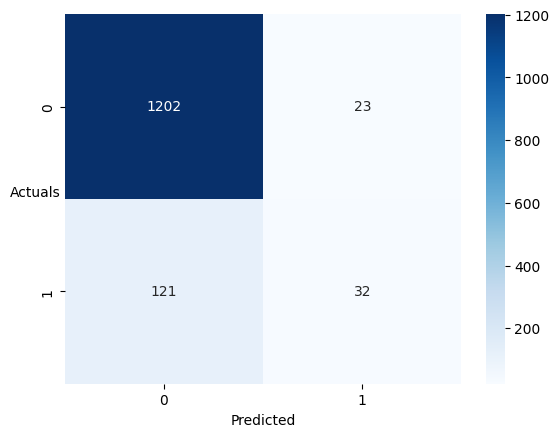

In [251]:
sns.heatmap((metrics.confusion_matrix(train['Default'],y_class_pred10)),annot=True,fmt='.5g',
            cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [252]:
print(metrics.classification_report(train['Default'],y_class_pred10,digits=3))

              precision    recall  f1-score   support

           0      0.909     0.981     0.943      1225
           1      0.582     0.209     0.308       153

    accuracy                          0.896      1378
   macro avg      0.745     0.595     0.626      1378
weighted avg      0.872     0.896     0.873      1378



In [253]:
# model performs better without SMOTE

In [254]:
# THRESH

In [255]:
from sklearn.metrics import roc_curve
fpr_logit,tpr_logit,thresholds_logit=roc_curve(train['Default'],y_pred_prob_train10)

optimal_idx_logit = np.argmax(tpr_logit-fpr_logit)
optimal_threshold_logit = thresholds_logit[optimal_idx_logit]
optimal_threshold_logit

0.13180724156915635

In [256]:
y_class_pred10=[]
for i in range(0,len(y_pred_prob_train10)):
    if np.array(y_pred_prob_train10)[i]>0.13:
        a=1
    else:
        a=0
    y_class_pred10.append(a)

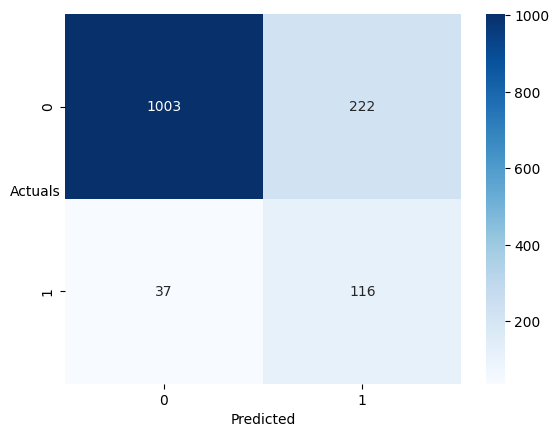

In [257]:
sns.heatmap((metrics.confusion_matrix(train['Default'],y_class_pred10)),annot=True,fmt='.5g',
            cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [258]:
print(metrics.classification_report(train['Default'],y_class_pred10,digits=3))

              precision    recall  f1-score   support

           0      0.964     0.819     0.886      1225
           1      0.343     0.758     0.473       153

    accuracy                          0.812      1378
   macro avg      0.654     0.788     0.679      1378
weighted avg      0.895     0.812     0.840      1378



-------------

In [259]:
# SMOTE DATASET LOGIT STARTS HERE!

In [260]:
model1_smote=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Current_Asset_Turnover_Rate + Quick_Asset_Turnover_Rate + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train_smote).fit()

Optimization terminated successfully.
         Current function value: 0.437981
         Iterations 7


In [261]:
model1_smote.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 2143
Model:                          Logit   Df Residuals:                     2129
Method:                           MLE   Df Model:                           13
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.3586
Time:                        18:32:58   Log-Likelihood:                -938.59
converged:                       True   LL-Null:                       -1463.3
Covariance Type:            nonrobust   LLR p-value:                4.043e-216
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -1.6762      0.218     -7.697      0.000      -2.103      -1.249
Operating_Expense_Rate                 -5.65e-11   1.89e-11     -2.990      0.003   -9.35e-11   -1.95e-11
Research_and_development_expense_rate  3.131e-10   4.29e-11      7.302      0.000    2.29e-10    3.97e-10
Tax_rate_A                               -6.8537      0.591    -11.605      0.000      -8.011      -5.696
Total_debt_to_Total_net_worth           169.9650      9.536     17.824      0.000     151.275     188.655
Inventory_Turnover_Rate_times          5.959e-11   2.09e-11      2.848      0.004    1.86e-11    1.01e-10
Fixed_Assets_Turnover_Frequency          62.5921      7.408      8.449      0.000      48.072      77.112
Cash_to_Current_Liability               -37.5416     12.416     -3.024      0.002     -61.877     -13.206
Inventory_to_Current_Liability          -61.9546      9.825     -6.306      0.000     -81.212     -42.698
Long_term_Liability_to_Current_Assets   -28.7958      7.957     -3.619      0.000     -44.390     -13.201
Current_Asset_Turnover_Rate             123.6795     58.114      2.128      0.033       9.777     237.582
Quick_Asset_Turnover_Rate              -2.98e-11   1.83e-11     -1.629      0.103   -6.57e-11    6.06e-12
Cash_Turnover_Rate                    -1.865e-10   2.52e-11     -7.400      0.000   -2.36e-10   -1.37e-10
Total_assets_to_GNP_price                40.2105     12.381      3.248      0.001      15.944      64.477
=========================================================================================================
"""

In [262]:
train_smote.columns

Index(['Operating_Expense_Rate', 'Research_and_development_expense_rate',
       'Tax_rate_A', 'Total_debt_to_Total_net_worth',
       'Inventory_Turnover_Rate_times', 'Fixed_Assets_Turnover_Frequency',
       'Cash_to_Current_Liability', 'Inventory_to_Current_Liability',
       'Long_term_Liability_to_Current_Assets', 'Total_expense_to_Assets',
       'Current_Asset_Turnover_Rate', 'Quick_Asset_Turnover_Rate',
       'Cash_Turnover_Rate', 'Total_assets_to_GNP_price', 'Default'],
      dtype='object')

In [263]:
train_smote.drop(['Current_Asset_Turnover_Rate'],axis=1,inplace=True)

In [264]:
model2_smote=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Quick_Asset_Turnover_Rate + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train_smote).fit()

Optimization terminated successfully.
         Current function value: 0.439039
         Iterations 7


In [265]:
model2_smote.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 2143
Model:                          Logit   Df Residuals:                     2130
Method:                           MLE   Df Model:                           12
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.3570
Time:                        18:32:59   Log-Likelihood:                -940.86
converged:                       True   LL-Null:                       -1463.3
Covariance Type:            nonrobust   LLR p-value:                4.000e-216
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -1.5741      0.212     -7.429      0.000      -1.989      -1.159
Operating_Expense_Rate                -5.419e-11   1.88e-11     -2.878      0.004   -9.11e-11   -1.73e-11
Research_and_development_expense_rate  3.042e-10   4.26e-11      7.146      0.000    2.21e-10    3.88e-10
Tax_rate_A                               -6.7996      0.589    -11.554      0.000      -7.953      -5.646
Total_debt_to_Total_net_worth           170.4870      9.527     17.896      0.000     151.815     189.159
Inventory_Turnover_Rate_times           4.78e-11   2.01e-11      2.382      0.017    8.47e-12    8.71e-11
Fixed_Assets_Turnover_Frequency          62.4690      7.385      8.459      0.000      47.994      76.944
Cash_to_Current_Liability               -37.7761     12.396     -3.047      0.002     -62.072     -13.480
Inventory_to_Current_Liability          -61.2201      9.785     -6.256      0.000     -80.399     -42.041
Long_term_Liability_to_Current_Assets   -27.1485      7.904     -3.435      0.001     -42.640     -11.656
Quick_Asset_Turnover_Rate             -1.973e-11   1.77e-11     -1.117      0.264   -5.43e-11    1.49e-11
Cash_Turnover_Rate                    -1.884e-10   2.52e-11     -7.483      0.000   -2.38e-10   -1.39e-10
Total_assets_to_GNP_price                40.4589     12.355      3.275      0.001      16.243      64.675
=========================================================================================================
"""

In [266]:
train_smote.drop(['Quick_Asset_Turnover_Rate'],axis=1,inplace=True)

In [267]:
model3_smote=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Inventory_Turnover_Rate_times + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train_smote).fit()

Optimization terminated successfully.
         Current function value: 0.439331
         Iterations 7


In [268]:
model3_smote.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 2143
Model:                          Logit   Df Residuals:                     2131
Method:                           MLE   Df Model:                           11
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.3566
Time:                        18:32:59   Log-Likelihood:                -941.49
converged:                       True   LL-Null:                       -1463.3
Covariance Type:            nonrobust   LLR p-value:                7.454e-217
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -1.5956      0.211     -7.573      0.000      -2.009      -1.183
Operating_Expense_Rate                -5.773e-11   1.86e-11     -3.107      0.002   -9.41e-11   -2.13e-11
Research_and_development_expense_rate  3.031e-10   4.25e-11      7.127      0.000     2.2e-10    3.87e-10
Tax_rate_A                               -6.8245      0.588    -11.598      0.000      -7.978      -5.671
Total_debt_to_Total_net_worth           169.4055      9.460     17.907      0.000     150.864     187.948
Inventory_Turnover_Rate_times          4.747e-11   2.01e-11      2.365      0.018    8.13e-12    8.68e-11
Fixed_Assets_Turnover_Frequency          63.2056      7.353      8.596      0.000      48.794      77.617
Cash_to_Current_Liability               -36.3358     12.312     -2.951      0.003     -60.466     -12.205
Inventory_to_Current_Liability          -61.7504      9.764     -6.324      0.000     -80.888     -42.613
Long_term_Liability_to_Current_Assets   -28.7115      7.786     -3.687      0.000     -43.972     -13.451
Cash_Turnover_Rate                    -1.903e-10   2.51e-11     -7.574      0.000    -2.4e-10   -1.41e-10
Total_assets_to_GNP_price                41.0803     12.335      3.330      0.001      16.904      65.256
=========================================================================================================
"""

In [269]:
train_smote.drop(['Inventory_Turnover_Rate_times'],axis=1,inplace=True)

In [270]:
model4_smote=SM.logit(formula='Default ~ Operating_Expense_Rate + Research_and_development_expense_rate + Tax_rate_A + Total_debt_to_Total_net_worth + Fixed_Assets_Turnover_Frequency + Cash_to_Current_Liability + Inventory_to_Current_Liability + Long_term_Liability_to_Current_Assets + Cash_Turnover_Rate + Total_assets_to_GNP_price',data=train_smote).fit()

Optimization terminated successfully.
         Current function value: 0.440637
         Iterations 7


In [271]:
model4_smote.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 2143
Model:                          Logit   Df Residuals:                     2132
Method:                           MLE   Df Model:                           10
Date:                Sun, 01 Oct 2023   Pseudo R-squ.:                  0.3547
Time:                        18:32:59   Log-Likelihood:                -944.28
converged:                       True   LL-Null:                       -1463.3
Covariance Type:            nonrobust   LLR p-value:                1.142e-216
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
Intercept                                -1.5071      0.207     -7.287      0.000      -1.912      -1.102
Operating_Expense_Rate                -5.781e-11   1.85e-11     -3.118      0.002   -9.41e-11   -2.15e-11
Research_and_development_expense_rate   3.16e-10   4.21e-11      7.500      0.000    2.33e-10    3.99e-10
Tax_rate_A                               -6.7417      0.585    -11.518      0.000      -7.889      -5.594
Total_debt_to_Total_net_worth           168.5614      9.453     17.831      0.000     150.034     187.089
Fixed_Assets_Turnover_Frequency          62.1337      7.314      8.496      0.000      47.799      76.468
Cash_to_Current_Liability               -38.4385     12.260     -3.135      0.002     -62.469     -14.408
Inventory_to_Current_Liability          -58.2669      9.582     -6.081      0.000     -77.048     -39.486
Long_term_Liability_to_Current_Assets   -26.0979      7.657     -3.408      0.001     -41.106     -11.090
Cash_Turnover_Rate                    -1.918e-10   2.51e-11     -7.636      0.000   -2.41e-10   -1.43e-10
Total_assets_to_GNP_price                36.7835     12.161      3.025      0.002      12.949      60.618
=========================================================================================================
"""

In [272]:
y_pred_prob_train=model4_smote.predict(train_smote)

In [273]:
y_pred_prob_train

0      0.70
1      0.06
2      0.07
3      0.48
4      0.02
       ... 
2138   0.18
2139   0.62
2140   0.95
2141   0.31
2142   0.57
Length: 2143, dtype: float64

In [274]:
y_class_pred=[]
for i in range(0,len(y_pred_prob_train)):
    if np.array(y_pred_prob_train)[i]>0.5:
        a=1
    else:
        a=0
    y_class_pred.append(a)

In [275]:
from sklearn import metrics

In [276]:
test

,Operating_Expense_Rate,Research_and_development_expense_rate,Tax_rate_A,Total_debt_to_Total_net_worth,Inventory_Turnover_Rate_times,Fixed_Assets_Turnover_Frequency,Cash_to_Current_Liability,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Total_expense_to_Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Total_assets_to_GNP_price,Default
1298,0.00,0.00,0.26,0.01,0.00,0.00,0.01,0.00,0.00,0.04,0.00,0.00,0.00,0.00,0
591,6310000000.00,1140000000.00,0.03,0.00,0.00,0.00,0.02,0.00,0.00,0.03,0.00,5780000000.00,6950000000.00,0.00,0
1318,0.00,0.00,0.00,0.00,1640000000.00,0.00,0.01,0.01,0.00,0.04,0.00,0.00,0.00,0.00,0
1067,0.00,0.00,0.21,0.00,0.00,0.02,0.00,0.00,0.01,0.02,0.00,0.00,1690000000.00,0.00,0
29,0.00,951000000.00,0.00,0.00,0.00,0.02,0.00,0.00,0.01,0.02,0.00,0.00,4380000000.00,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
952,0.00,0.00,0.00,0.01,19100000.00,0.02,0.00,0.00,0.00,0.01,0.00,9710000000.00,1460000000.00,0.01,0
208,0.00,3875000000.00,0.00,0.00,7700000000.00,0.00,0.02,0.03,0.00,0.06,0.00,9460000000.00,0.00,0.00,0
1433,0.00,0.00,0.23,0.02,9537500000.00,0.00,0.00,0.01,0.01,0.07,0.00,96600000.00,6250000000.00,0.00,0
1612,0.00,1600000000.00,0.13,0.01,8640000000.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,6850000000.00,0.00,0


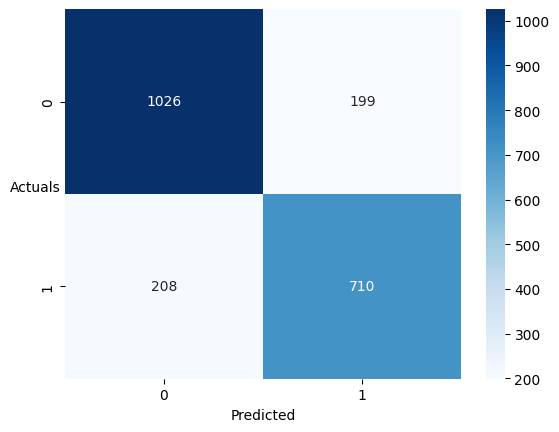

In [277]:
sns.heatmap((metrics.confusion_matrix(train_smote['Default'],y_class_pred)),annot=True,fmt='.5g',
            cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [278]:
1079+205+217+746

2247

In [279]:
746/(746+217)

0.77466251298027

In [280]:
746/(746+205)

0.7844374342797056

In [281]:
y_pred_prob = model4_smote.predict()

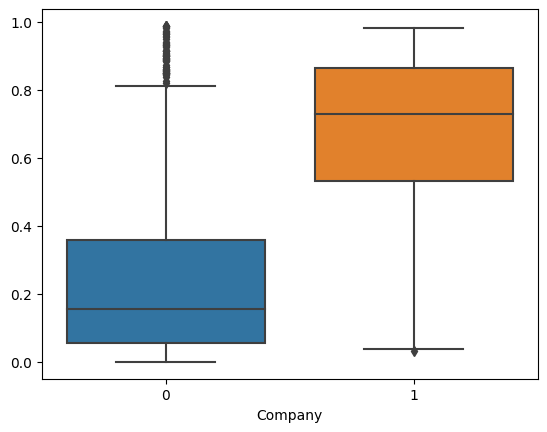

In [282]:
sns.boxplot(x=train_smote['Default'],y=y_pred_prob)
plt.xlabel('Company');

In [283]:
from sklearn.metrics import roc_curve
fpr,tpr,thresholds=roc_curve(train_smote['Default'],y_pred_prob_train)

In [284]:
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.424655068083494

In [285]:
y_class_pred=[]
for i in range(0,len(y_pred_prob_train)):
    if np.array(y_pred_prob_train)[i]>0.42:
        a=1
    else:
        a=0
    y_class_pred.append(a)

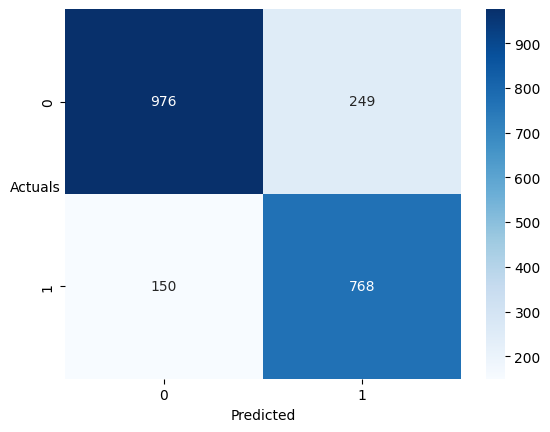

In [286]:
sns.heatmap((metrics.confusion_matrix(train_smote['Default'],y_class_pred)),annot=True,fmt='.5g',
            cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [287]:
859/(858+104)

0.8929313929313929

In [288]:
859/(859+323)

0.7267343485617598

In [289]:
# Improved

PART A: Validate the Model on Test Dataset and state the performance metrics. Also state interpretation from the model

In [290]:
y_pred_prob_test=model10.predict(test)

In [291]:
y_pred_logit_test=[]
for i in range(0,len(y_pred_prob_test)):
    if np.array(y_pred_prob_test)[i]>0.13:
        a=1
    else:
        a=0
    y_pred_logit_test.append(a)

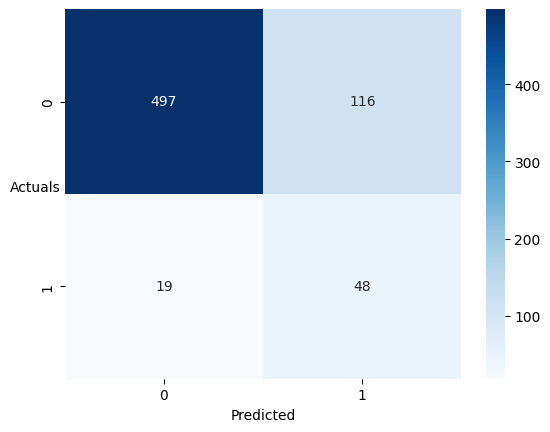

In [292]:
sns.heatmap((metrics.confusion_matrix(test['Default'],y_pred_logit_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [293]:
from sklearn.metrics import accuracy_score
score_model10=accuracy_score(test['Default'],y_pred_logit_test)
print(score_model10)
print(metrics.classification_report(test['Default'],y_pred_logit_test,digits=3))

0.8014705882352942
              precision    recall  f1-score   support

           0      0.963     0.811     0.880       613
           1      0.293     0.716     0.416        67

    accuracy                          0.801       680
   macro avg      0.628     0.764     0.648       680
weighted avg      0.897     0.801     0.835       680



In [294]:
logit_precision_test=round(metrics.precision_score(test['Default'],y_pred_logit_test),3)
logit_precision_test

0.293

In [295]:
logit_recall_test=round(metrics.recall_score(test['Default'],y_pred_logit_test),3)
logit_recall_test

0.716

In [296]:
logit_f1_test=round(metrics.f1_score(test['Default'],y_pred_logit_test),3)
logit_f1_test

0.416

In [297]:
# SMOTE TEST

In [298]:
y_pred_prob_test=model4_smote.predict(test)

In [299]:
y_class_pred_test=[]
for i in range(0,len(y_pred_prob_test)):
    if np.array(y_pred_prob_test)[i]>0.42:
        a=1
    else:
        a=0
    y_class_pred_test.append(a)

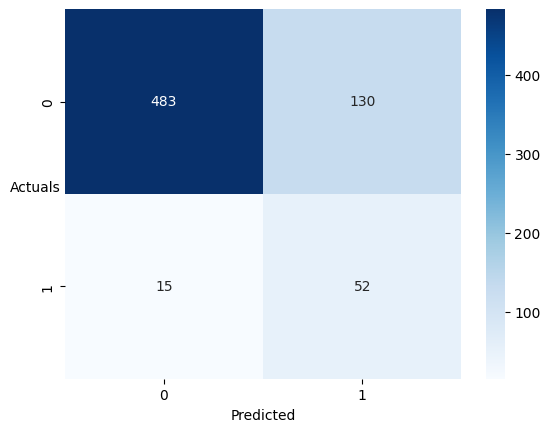

In [300]:
sns.heatmap((metrics.confusion_matrix(test['Default'],y_class_pred_test)),annot=True,fmt='.5g'
            ,cmap='Blues');
plt.xlabel('Predicted');
plt.ylabel('Actuals',rotation=0);

In [301]:
print(metrics.classification_report(test['Default'],y_class_pred_test,digits=3))

              precision    recall  f1-score   support

           0      0.970     0.788     0.869       613
           1      0.286     0.776     0.418        67

    accuracy                          0.787       680
   macro avg      0.628     0.782     0.644       680
weighted avg      0.902     0.787     0.825       680



In [302]:
# ROC CURVE TEST LOGIT

In [303]:
X=Company_num.drop(["Default","Net_Income_Flag","Liability_Assets_Flag"], axis=1)
# dependent variable
y=Company_num["Default"].astype('int64')
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33,random_state=42)

0.8268729760658373


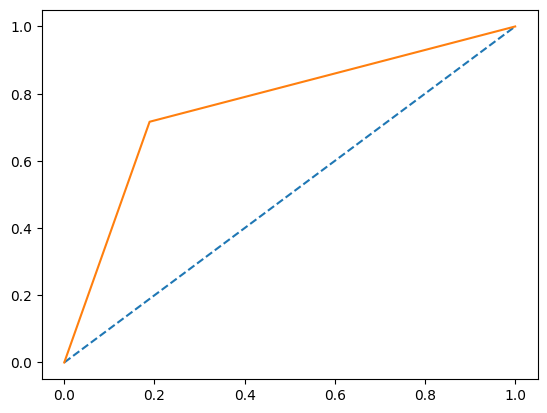

In [304]:
from sklearn.metrics import roc_auc_score
fpr_logit_test,tpr_logit_test,thresholds_logit_test=roc_curve(test['Default'],y_pred_logit_test)
print(roc_auc_score(y_test,model10.predict(X_test)))
plt.plot([0, 1], [0, 1],linestyle='--')
plt.plot(fpr_logit_test,tpr_logit_test);

PART A: Build a Random Forest Model on Train Dataset. Also showcase your model building approach

In [305]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth':[3,5,7,11,15],
    'min_samples_leaf':[15,30,40,50],
    'min_samples_split':[30,45,60],
    'n_estimators':[13,25,50]
}

rfcl_model=RandomForestClassifier()

grid_search=GridSearchCV(estimator=rfcl_model,param_grid=param_grid)

In [306]:
X=Company_num.drop(["Default","Net_Income_Flag","Liability_Assets_Flag"], axis=1)
# dependent variable
y=Company_num["Default"].astype('int64')
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33,random_state=42)

In [307]:
y_train.value_counts()

0    1225
1     153
Name: Default, dtype: int64

In [308]:
y_train.values

array([0, 0, 0, ..., 1, 0, 0], dtype=int64)

In [309]:
X_train.shape

(1378, 53)

In [310]:
#X_train

In [311]:
grid_search.fit(X_train,y_train)
print(grid_search.best_params_)

{'max_depth': 7, 'min_samples_leaf': 15, 'min_samples_split': 30, 'n_estimators': 25}


In [312]:
# {'max_depth': 15, 'min_samples_leaf': 15, 'min_samples_split': 30, 'n_estimators': 50}

In [313]:
rfcl=grid_search.best_estimator_

In [314]:
rfcl

RandomForestClassifier(max_depth=7, min_samples_leaf=15, min_samples_split=30,
                       n_estimators=25)

In [315]:
pred_train_rf=rfcl.predict(X_train)

In [316]:
model_score=rfcl.score(X_train,y_train)
print(model_score)
print(confusion_matrix(y_train,pred_train_rf))
print(metrics.classification_report(y_train, pred_train_rf))

0.9368650217706821
[[1215   10]
 [  77   76]]
              precision    recall  f1-score   support

           0       0.94      0.99      0.97      1225
           1       0.88      0.50      0.64       153

    accuracy                           0.94      1378
   macro avg       0.91      0.74      0.80      1378
weighted avg       0.93      0.94      0.93      1378



PART A: Validate the Random Forest Model on test Dataset and state the performance metrics. Also state interpretation from the model

In [317]:
pred_test_rf=rfcl.predict(X_test)

In [318]:
score_rfcl=rfcl.score(X_test,y_test)
print(score_rfcl)
print(confusion_matrix(y_test,pred_test_rf))
print(metrics.classification_report(y_test,pred_test_rf))

0.9323529411764706
[[603  10]
 [ 36  31]]
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       613
           1       0.76      0.46      0.57        67

    accuracy                           0.93       680
   macro avg       0.85      0.72      0.77       680
weighted avg       0.93      0.93      0.92       680



In [319]:
rf_presicion_test=round(metrics.precision_score(y_test,pred_test_rf),3)
rf_presicion_test

0.756

In [320]:
rf_recall_test=round(metrics.recall_score(y_test,pred_test_rf),3)
rf_recall_test

0.463

In [321]:
rf_f1_test=round(metrics.f1_score(y_test,pred_test_rf),3)
rf_f1_test

0.574

PART A: Build a LDA Model on Train Dataset. Also showcase your model building approach

In [322]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [323]:
LDA=LinearDiscriminantAnalysis()

In [324]:
lda_model=LDA.fit(X_train,y_train)

In [325]:
pred_train_lda=lda_model.predict(X_train)

In [326]:
score_lda=lda_model.score(X_train,y_train)
print(score_lda)
print(confusion_matrix(y_train,pred_train_lda))
print(metrics.classification_report(y_train,pred_train_lda))

0.9179970972423802
[[1178   47]
 [  66   87]]
              precision    recall  f1-score   support

           0       0.95      0.96      0.95      1225
           1       0.65      0.57      0.61       153

    accuracy                           0.92      1378
   macro avg       0.80      0.77      0.78      1378
weighted avg       0.91      0.92      0.92      1378



In [327]:
pred_train_lda_prob=lda_model.predict_proba(X_train)[:,1]

In [328]:
fpr_lda,tpr_lda,thresholds_lda=roc_curve(y_train,pred_train_lda_prob)

In [329]:
#optimal_idx_lda=np.argmax(tpr_lda-fpr_lda)
#optimal_threshold_lda=thresholds_lda[optimal_idx_lda]
#optimal_threshold_lda

In [330]:
#y_pred_lda_train=[]
#for i in range(0,len(pred_train_lda_prob)):
#    if np.array(pred_train_lda_prob)[i]>0.03:
#        a=1
#    else:
#        a=0
#    y_pred_lda_train.append(a)

In [331]:
#sns.heatmap((metrics.confusion_matrix(y_train,y_pred_lda_train)),annot=True,fmt='.5g'
#            ,cmap='Blues');
#plt.xlabel('Predicted');
#plt.ylabel('Actuals',rotation=0);

In [332]:
#score_lda_thresh=lda_model.score(X_train,y_train)
#print(score_lda)
#print(confusion_matrix(y_train,pred_train_lda))
#print(metrics.classification_report(y_train,y_pred_lda_train))

PART A: Validate the LDA Model on test Dataset and state the performance metrics. Also state interpretation from the model

In [333]:
pred_test_lda=lda_model.predict(X_test)
pred_test_lda_prob=lda_model.predict_proba(X_test)[:,1]

In [334]:
score_lda_test=accuracy_score(y_test,pred_test_lda)
print(score_lda_test)
print(confusion_matrix(y_test,pred_test_lda))
print(metrics.classification_report(y_test,pred_test_lda))

0.9147058823529411
[[581  32]
 [ 26  41]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.95       613
           1       0.56      0.61      0.59        67

    accuracy                           0.91       680
   macro avg       0.76      0.78      0.77       680
weighted avg       0.92      0.91      0.92       680



In [335]:
#y_pred_lda_test=[]
#for i in range(0,len(pred_test_lda_prob)):
#    if np.array(pred_test_lda_prob)[i]>0.03:
#        a=1
#    else:
#        a=0
#    y_pred_lda_test.append(a)

In [336]:
#sns.heatmap((metrics.confusion_matrix(y_test,y_pred_lda_test)),annot=True,fmt='.5g'
#            ,cmap='Blues');
#plt.xlabel('Predicted');
#plt.ylabel('Actuals',rotation=0);

In [337]:
#score_lda_test=accuracy_score(y_test,y_pred_lda_test)
#print(score_lda_test)
#print(confusion_matrix(y_test,pred_test_lda))
#print(metrics.classification_report(y_test,y_pred_lda_test))

In [338]:
lda_precision_test=round(metrics.precision_score(y_test,pred_test_lda),3)
lda_precision_test

0.562

In [339]:
lda_recall_test=round(metrics.recall_score(y_test,pred_test_lda),3)
lda_recall_test

0.612

In [340]:
lda_f1_test=round(metrics.f1_score(y_test,pred_test_lda),3)
lda_f1_test

0.586

In [341]:
# after changing the threshold, recall on the test set increased

PART A: Compare the performances of Logistic Regression, Random Forest, and LDA models (include ROC curve)

In [342]:
from sklearn.metrics import roc_auc_score,roc_curve

AUC Score: 0.685240193810718


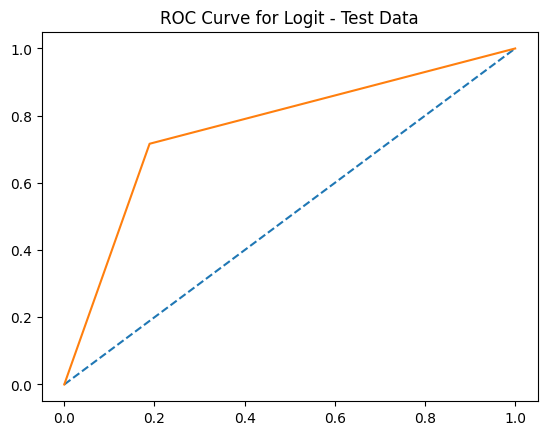

In [343]:
plt.title('ROC Curve for Logit - Test Data')
logit_auc_test=roc_auc_score(y_test,y_pred_prob_test>0.12)
print(f"AUC Score: {logit_auc_test}")
plt.plot([0, 1], [0, 1],linestyle='--')
plt.plot(fpr_logit_test,tpr_logit_test);

AUC Score: 0.898444157678167


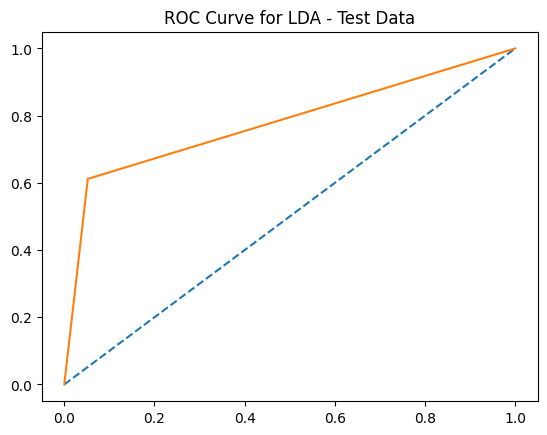

In [344]:
plt.title('ROC Curve for LDA - Test Data')
fpr_lda_test,tpr_lda_test,thresholds_lda_test=roc_curve(y_test,pred_test_lda)
lda_auc_test=roc_auc_score(y_test,pred_test_lda_prob)
print(f"AUC Score: {lda_auc_test}")
plt.plot([0, 1], [0, 1],linestyle='--')
plt.plot(fpr_lda_test,tpr_lda_test);

AUC Score: 0.9285140366682088


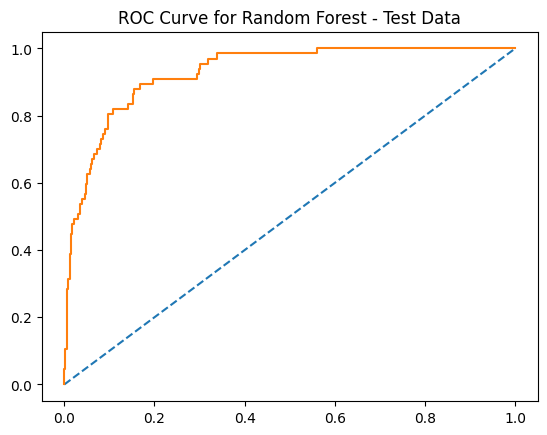

In [345]:
plt.title('ROC Curve for Random Forest - Test Data')
probs_rfcl=rfcl.predict_proba(X_test)
probs_rfcl=probs_rfcl[:,1]
# calculate AUC
auc_rfcl=roc_auc_score(y_test,probs_rfcl)
print(f"AUC Score: {auc_rfcl}")
# calculate roc curve
fpr_rfcl,tpr_rfcl,thresholds_rfcl=roc_curve(y_test,probs_rfcl)
plt.plot([0, 1], [0, 1],linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_rfcl,tpr_rfcl);

In [346]:
model_scores = [
    {'model': 'Logistic Regression', 'accuracy': score_model10, 'precision': logit_precision_test, 'recall': logit_recall_test, 'f1-score': logit_f1_test , 'AUC': logit_auc_test, #for class 1
    'remark':'All metrics are for class 1'},
    {'model': 'LDA', 'accuracy': 0.8311, 'precision': lda_precision_test, 'recall': lda_recall_test, 'f1-score': lda_f1_test, 'AUC': roc_auc_score(y_test,lda_model.predict_proba(X_test)[:,1]),
    'remark':'All metrics are for class 1'},
    {'model': 'Random Forest', 'accuracy': score_rfcl, 'precision': rf_presicion_test, 'recall': rf_recall_test, 'f1-score' : rf_f1_test, 'AUC': roc_auc_score(y_test,rfcl.predict_proba(X_test)[:,1]),
    'remark':'All metrics are for class 1'}
]

model_scores=pd.DataFrame(model_scores)
model_scores

,model,accuracy,precision,recall,f1-score,AUC,remark
0,Logistic Regression,0.80,0.29,0.72,0.42,0.69,All metrics are for class 1
1,LDA,0.83,0.56,0.61,0.59,0.90,All metrics are for class 1
2,Random Forest,0.93,0.76,0.46,0.57,0.93,All metrics are for class 1


EDA on the 13 variables after treating multicolinearity ---

In [347]:
df=pd.DataFrame(Company_all[['Operating_Expense_Rate', 'Research_and_development_expense_rate',
       'Tax_rate_A', 'Total_debt_to_Total_net_worth',
       'Inventory_Turnover_Rate_times', 'Fixed_Assets_Turnover_Frequency',
       'Cash_to_Current_Liability', 'Inventory_to_Current_Liability',
       'Long_term_Liability_to_Current_Assets', 'Current_Asset_Turnover_Rate',
       'Quick_Asset_Turnover_Rate', 'Cash_Turnover_Rate',
       'Total_assets_to_GNP_price','Default']])
df

,Operating_Expense_Rate,Research_and_development_expense_rate,Tax_rate_A,Total_debt_to_Total_net_worth,Inventory_Turnover_Rate_times,Fixed_Assets_Turnover_Frequency,Cash_to_Current_Liability,Inventory_to_Current_Liability,Long_term_Liability_to_Current_Assets,Current_Asset_Turnover_Rate,Quick_Asset_Turnover_Rate,Cash_Turnover_Rate,Total_assets_to_GNP_price,Default
0,8820000000.00,0.00,0.00,0.03,707000000.00,0.00,0.00,0.02,0.00,0.00,0.00,5470000000.00,0.03,0
1,9380000000.00,4230000000.00,0.00,0.01,0.00,8850000000.00,0.00,0.00,0.00,0.00,0.00,882000000.00,0.01,1
2,3800000000.00,815000000.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,0.00,941000000.00,679000000.00,0.00,0
3,6440000000.00,0.00,0.01,0.01,1340000000.00,0.00,0.00,0.04,0.00,0.00,5310000000.00,6020000000.00,0.00,0
4,3680000000.00,0.00,0.40,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5670000000.00,0.01,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2053,0.00,6490000000.00,0.18,0.00,8040000000.00,0.00,0.08,0.02,0.00,0.00,0.00,0.00,0.00,0
2054,0.00,0.00,0.00,0.00,0.00,6810000000.00,0.00,0.00,0.01,0.00,0.00,2340000000.00,0.00,0
2055,0.00,8370000000.00,0.00,0.00,0.00,2190000000.00,0.00,0.00,0.02,0.00,0.00,8240000000.00,0.01,0
2056,3750000000.00,0.00,0.31,0.00,896000000.00,0.00,0.00,0.02,0.00,0.00,7380000000.00,4050000000.00,0.00,0


In [348]:
df.shape

(2058, 14)

In [349]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2058 entries, 0 to 2057
Data columns (total 14 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Operating_Expense_Rate                 2058 non-null   float64
 1   Research_and_development_expense_rate  2058 non-null   float64
 2   Tax_rate_A                             2058 non-null   float64
 3   Total_debt_to_Total_net_worth          2037 non-null   float64
 4   Inventory_Turnover_Rate_times          2058 non-null   float64
 5   Fixed_Assets_Turnover_Frequency        2058 non-null   float64
 6   Cash_to_Current_Liability              2058 non-null   float64
 7   Inventory_to_Current_Liability         2058 non-null   float64
 8   Long_term_Liability_to_Current_Assets  2058 non-null   float64
 9   Current_Asset_Turnover_Rate            2058 non-null   float64
 10  Quick_Asset_Turnover_Rate              2058 non-null   float64
 11  Cash

In [350]:
df.isna().sum()

Operating_Expense_Rate                    0
Research_and_development_expense_rate     0
Tax_rate_A                                0
Total_debt_to_Total_net_worth            21
Inventory_Turnover_Rate_times             0
Fixed_Assets_Turnover_Frequency           0
Cash_to_Current_Liability                 0
Inventory_to_Current_Liability            0
Long_term_Liability_to_Current_Assets     0
Current_Asset_Turnover_Rate               0
Quick_Asset_Turnover_Rate                 0
Cash_Turnover_Rate                        0
Total_assets_to_GNP_price                 0
Default                                   0
dtype: int64

In [351]:
df=pd.DataFrame(imputer.fit_transform(df),columns=df.columns)

In [352]:
df.isna().sum()

Operating_Expense_Rate                   0
Research_and_development_expense_rate    0
Tax_rate_A                               0
Total_debt_to_Total_net_worth            0
Inventory_Turnover_Rate_times            0
Fixed_Assets_Turnover_Frequency          0
Cash_to_Current_Liability                0
Inventory_to_Current_Liability           0
Long_term_Liability_to_Current_Assets    0
Current_Asset_Turnover_Rate              0
Quick_Asset_Turnover_Rate                0
Cash_Turnover_Rate                       0
Total_assets_to_GNP_price                0
Default                                  0
dtype: int64

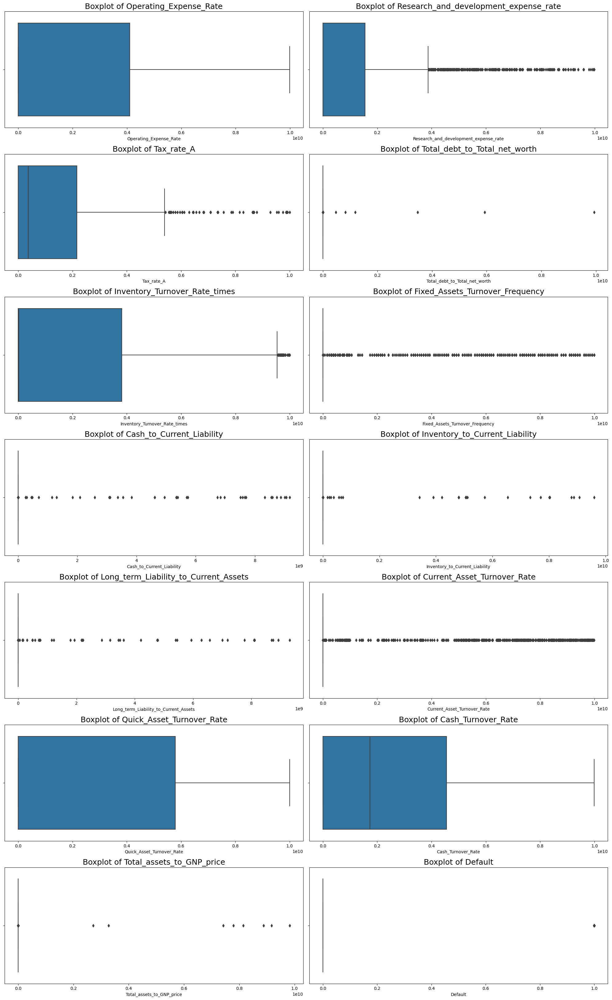

In [353]:
plt.figure(figsize=(20,60))
features=df.columns
for i in range(len(features)):
        plt.subplot(13,2,i+1)
        sns.boxplot(data=df,x=df.columns[i])
        plt.title(f"Boxplot of {df.columns[i]}",fontsize=18)
        plt.tight_layout();

In [354]:
for i in features:
    ur,lr=remove_outlier(df[i])
    df[i]=np.where(df[i]>ur,ur,df[i])
    df[i]=np.where(df[i]<lr,lr,df[i])

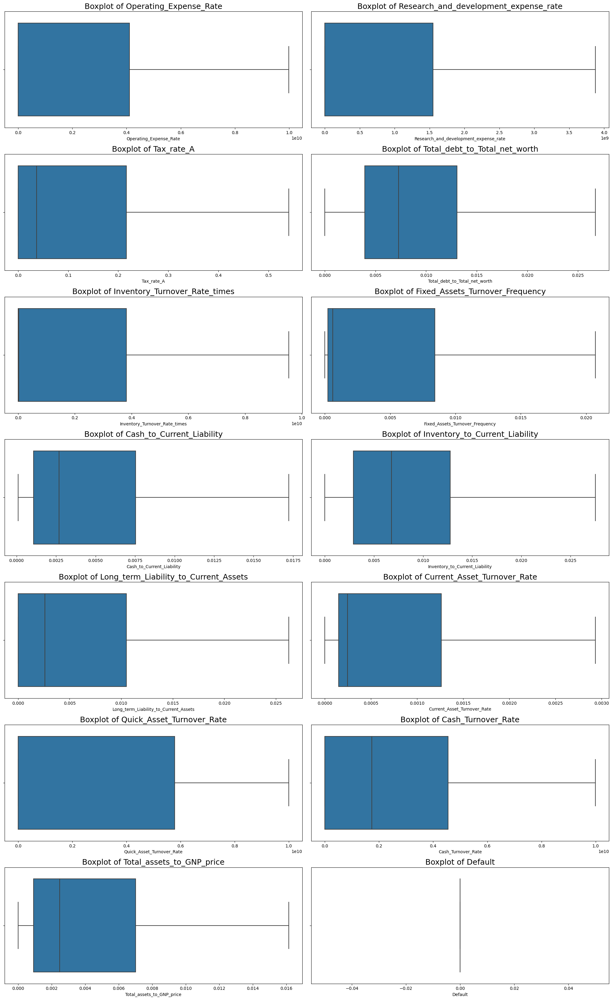

In [355]:
#df=df.drop(['Default'],axis=1)
plt.figure(figsize=(20,60))
features=df.columns
for i in range(len(features)):
        plt.subplot(13,2,i+1)
        sns.boxplot(data=df,x=df.columns[i])
        plt.title(f"Boxplot of {df.columns[i]}",fontsize=18)
        plt.tight_layout();

<Figure size 10000x10000 with 0 Axes>

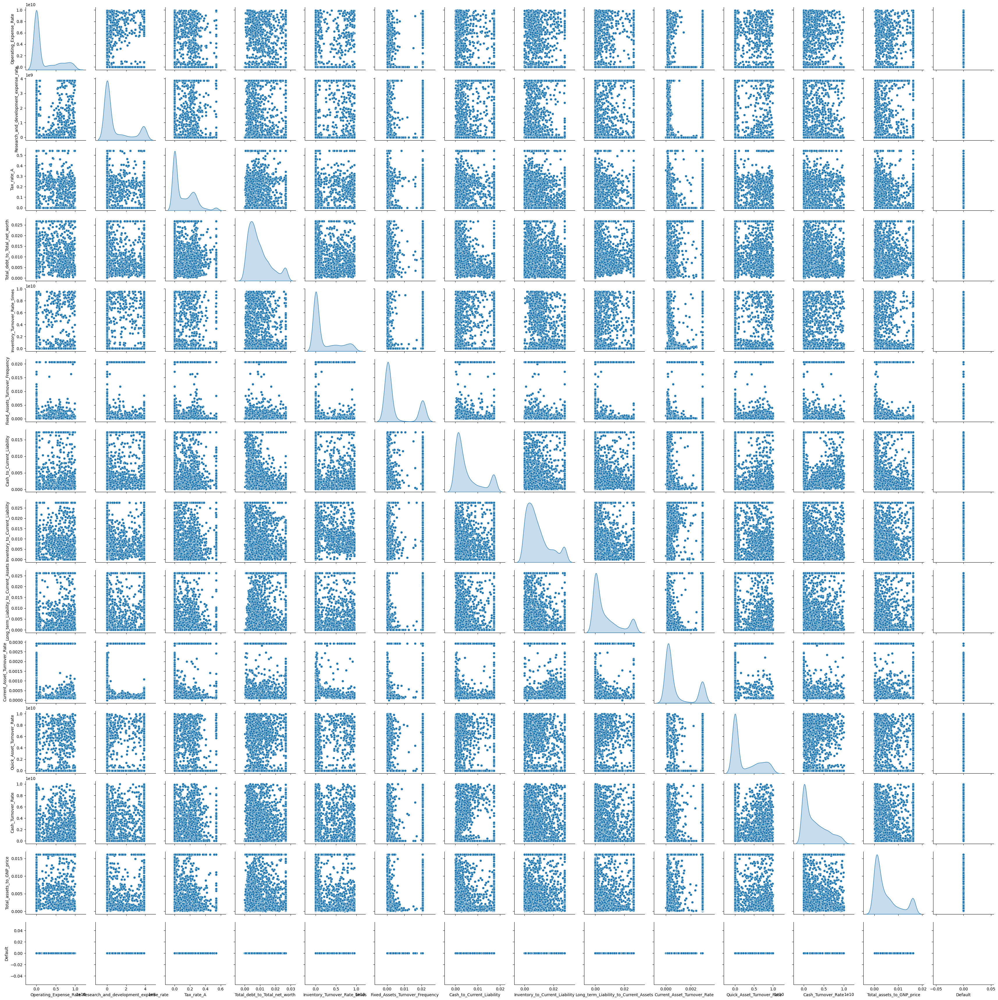

In [356]:
fig=plt.figure(figsize=(100,100))
sns.pairplot(df,diag_kind="kde")
plt.xticks(rotation=90)
plt.yticks(rotation=90);

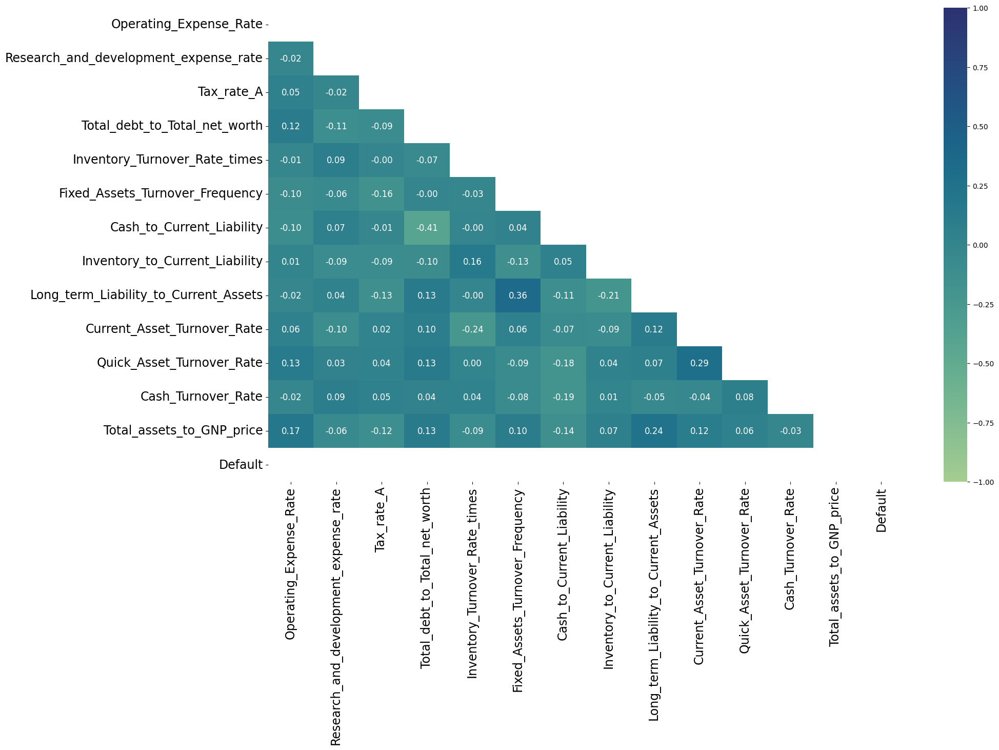

In [357]:
plt.figure(figsize=(20,12))
mask=np.triu(np.ones_like(df.corr()))
sns.heatmap(df.corr(),annot=True,fmt='.2f',cmap='crest',mask=mask,annot_kws={'size':12},vmin=-1,vmax=+1)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17);

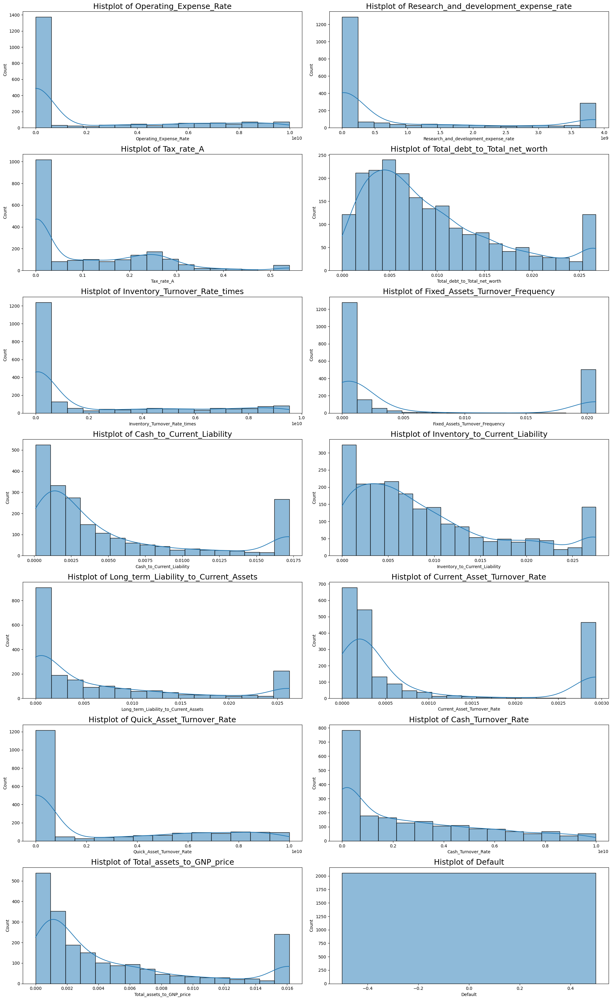

In [359]:
plt.figure(figsize=(20,60))
features=df.columns
for i in range(len(features)):
        plt.subplot(13,2,i+1)
        sns.histplot(data=df,x=df.columns[i],kde=True)
        plt.title(f"Histplot of {df.columns[i]}",fontsize=18)
        plt.tight_layout();

PART A: Conclusions and Recommendations